In [1]:
import pandas as pd
import numpy as np
import adjustText

In [2]:
####### WORKING #######
#!pip install easy-exchange-rates
#!pip install tqdm

In [2]:
df = pd.read_csv("Recipe_CB_Aerospace_and_Defense_Since2019_2.csv")

In [3]:
df.head(5)

,name,money_raised,announced_date,location,industries,description,funding_type,lead_investors,total_funding
0,SpaceX,"$1,724,965,480","May 24, 2022","Hawthorne, California, United States, North Am...","Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,—,"$9,779,343,846"
1,Anduril Industries,"$1,480,000,000","Dec 2, 2022","Costa Mesa, California, United States, North A...","Aerospace, Government, Military, National Secu...",Anduril Industries is a defense product compan...,Series E,Valor Equity Partners,"$2,171,000,000"
2,Sierra Space,"$1,400,000,000","Nov 19, 2021","Louisville, Colorado, United States, North Ame...","Advanced Materials, Aerospace, Industrial Manu...",Sierra Space is a commercial space company tha...,Series A,"Coatue, General Atlantic, Moore Strategic Vent...","$1,690,000,000"
3,OneWeb,"$1,250,000,000","Mar 18, 2019","London, England, United Kingdom, Europe","Aerospace, Internet, Satellite Communication, ...",OneWeb is building a space-based communication...,Venture - Series Unknown,SoftBank,"$4,700,000,000"
4,SpaceX,"$850,000,000","Feb 16, 2021","Hawthorne, California, United States, North Am...","Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,Sequoia Capital,"$9,779,343,846"


### Expand location column to cities, countries etc.

In [5]:
df[['city', 'state', 'country', 'region']] = df['location'].str.split(',', n=3, expand=True)
df.drop(['location'], 
        axis=1, 
        inplace=True)
df['city'] = df['city'].str.strip()
df['state'] = df['state'].str.strip()
df['country'] = df['country'].str.strip()
df['region'] = df['region'].str.strip()

In [6]:
df.head(5)

,name,money_raised,announced_date,industries,description,funding_type,lead_investors,total_funding,city,state,country,region
0,SpaceX,"$1,724,965,480","May 24, 2022","Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,—,"$9,779,343,846",Hawthorne,California,United States,North America
1,Anduril Industries,"$1,480,000,000","Dec 2, 2022","Aerospace, Government, Military, National Secu...",Anduril Industries is a defense product compan...,Series E,Valor Equity Partners,"$2,171,000,000",Costa Mesa,California,United States,North America
2,Sierra Space,"$1,400,000,000","Nov 19, 2021","Advanced Materials, Aerospace, Industrial Manu...",Sierra Space is a commercial space company tha...,Series A,"Coatue, General Atlantic, Moore Strategic Vent...","$1,690,000,000",Louisville,Colorado,United States,North America
3,OneWeb,"$1,250,000,000","Mar 18, 2019","Aerospace, Internet, Satellite Communication, ...",OneWeb is building a space-based communication...,Venture - Series Unknown,SoftBank,"$4,700,000,000",London,England,United Kingdom,Europe
4,SpaceX,"$850,000,000","Feb 16, 2021","Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,Sequoia Capital,"$9,779,343,846",Hawthorne,California,United States,North America


### Format date column - announced_date

In [7]:
df['announced_date'] = pd.to_datetime(df['announced_date'], format = '%b %d, %Y')
df['announced_year'] = df['announced_date'].dt.year
df['announced_month'] = df['announced_date'].dt.month
df.head(5)

,name,money_raised,announced_date,industries,description,funding_type,lead_investors,total_funding,city,state,country,region,announced_year,announced_month
0,SpaceX,"$1,724,965,480",2022-05-24,"Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,—,"$9,779,343,846",Hawthorne,California,United States,North America,2022,5
1,Anduril Industries,"$1,480,000,000",2022-12-02,"Aerospace, Government, Military, National Secu...",Anduril Industries is a defense product compan...,Series E,Valor Equity Partners,"$2,171,000,000",Costa Mesa,California,United States,North America,2022,12
2,Sierra Space,"$1,400,000,000",2021-11-19,"Advanced Materials, Aerospace, Industrial Manu...",Sierra Space is a commercial space company tha...,Series A,"Coatue, General Atlantic, Moore Strategic Vent...","$1,690,000,000",Louisville,Colorado,United States,North America,2021,11
3,OneWeb,"$1,250,000,000",2019-03-18,"Aerospace, Internet, Satellite Communication, ...",OneWeb is building a space-based communication...,Venture - Series Unknown,SoftBank,"$4,700,000,000",London,England,United Kingdom,Europe,2019,3
4,SpaceX,"$850,000,000",2021-02-16,"Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,Sequoia Capital,"$9,779,343,846",Hawthorne,California,United States,North America,2021,2


### Fetch (using easy_exchange_rates) an optimised forex rates table, given the date range

In [8]:
from easy_exchange_rates import API
api = API()

df1 = df['announced_date'].unique()
end_date=pd.to_datetime(df1.max(), format="%Y-%m-%d")
start_date=pd.to_datetime(df1.min(), format="%Y-%m-%d")

df_rates = api.get_exchange_rates(
    base_currency="EUR", 
    start_date=start_date.strftime('%Y-%m-%d'),
    end_date=end_date.strftime('%Y-%m-%d'),
    targets=["USD","NOK", "CNY"]
)
print(df_rates.head(5))

                CNY     NOK     USD
TIME_PERIOD                        
2019-01-02   7.8165  9.9108  1.1397
2019-01-03   7.8019  9.9113  1.1348
2019-01-04   7.8280  9.8648  1.1403
2019-01-07   7.8421  9.8018  1.1445
2019-01-08   7.8405  9.7750  1.1440


### Backfill missing dates in the rate dataframe

In [9]:
#df_rates.index
# index is of type string, not datetime
#
date_range = pd.date_range(start=start_date.strftime('%Y-%m-%d'), 
                           end=end_date.strftime('%Y-%m-%d'), 
                           freq="D") 
data_reindexed = df_rates.reindex(date_range.strftime('%Y-%m-%d'))  # index is of type string, not datetime
data_reindexed.head(5)

df_rates_backfilled = data_reindexed.fillna(method='bfill')
df_rates_backfilled.head(5)

,CNY,NOK,USD
2019-01-01,7.8165,9.9108,1.1397
2019-01-02,7.8165,9.9108,1.1397
2019-01-03,7.8019,9.9113,1.1348
2019-01-04,7.8280,9.8648,1.1403
2019-01-05,7.8421,9.8018,1.1445


In [10]:
# rate_date = df_rates.iloc[df_rates.index == '2019-10-15']
# print(rate_date['USD'][0])
# print(rate_date['NOK'][0])
# print(rate_date['USD'][0]/rate_date['NOK'][0])
def convert_to_currency(amount, currency, date):
    converted = amount
    
    if currency == '€':
        rate_date = df_rates_backfilled.iloc[df_rates_backfilled.index == date]
        converted = int(amount) * rate_date['USD'][0]
    elif currency == 'NOK':
        rate_date = df_rates_backfilled.iloc[df_rates_backfilled.index == date]
        converted = int(amount) * (rate_date['USD'][0]/rate_date['NOK'][0])
    elif currency == 'CN¥':
        rate_date = df_rates_backfilled.iloc[df_rates_backfilled.index == date]
        converted = int(amount) * (rate_date['USD'][0]/rate_date['CNY'][0])

    return converted


### Handle currency columns

In [11]:
currency_pattern = '^([$|€|CN¥|NOK]+)(\d+)'

def transform_money_column(df, column):
    df[column] = df[column].str.replace(',', '')
    df[['part_0', '{}_currency'.format(column) , '{}_amount'.format(column), 'part_3']] = df[column].str.split(currency_pattern, 
                                                                                                        n=-1, 
                                                                                                        expand=True, 
                                                                                                        regex = True)
    df.drop(['part_0', 'part_3'], 
            axis=1, 
            inplace=True)
    df['{}_currency'.format(column)] = df['{}_currency'.format(column)].str.strip()
    df['{}_amount'.format(column)] = df['{}_amount'.format(column)].str.strip()


transform_money_column(df, 'money_raised')
transform_money_column(df, 'total_funding')

df.head(2)

,name,money_raised,announced_date,industries,description,funding_type,lead_investors,total_funding,city,state,country,region,announced_year,announced_month,money_raised_currency,money_raised_amount,total_funding_currency,total_funding_amount
0,SpaceX,$1724965480,2022-05-24,"Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,—,$9779343846,Hawthorne,California,United States,North America,2022,5,$,1724965480,$,9779343846
1,Anduril Industries,$1480000000,2022-12-02,"Aerospace, Government, Military, National Secu...",Anduril Industries is a defense product compan...,Series E,Valor Equity Partners,$2171000000,Costa Mesa,California,United States,North America,2022,12,$,1480000000,$,2171000000


In [12]:
df[df['name'] == 'Nordiq Products AS']

,name,money_raised,announced_date,industries,description,funding_type,lead_investors,total_funding,city,state,country,region,announced_year,announced_month,money_raised_currency,money_raised_amount,total_funding_currency,total_funding_amount
889,Nordiq Products AS,NOK4583879,2022-03-04,"Health Diagnostics, Information Technology, Me...",On a mission to help first responders services...,Seed,—,NOK27360096,Oslo,Oslo,Norway,Europe,2022,3,NOK,4583879,NOK,27360096
941,Nordiq Products AS,NOK3538063,2023-04-17,"Health Diagnostics, Information Technology, Me...",On a mission to help first responders services...,Seed,—,NOK27360096,Oslo,Oslo,Norway,Europe,2023,4,NOK,3538063,NOK,27360096
965,Nordiq Products AS,NOK2715748,2022-10-21,"Health Diagnostics, Information Technology, Me...",On a mission to help first responders services...,Seed,—,NOK27360096,Oslo,Oslo,Norway,Europe,2022,10,NOK,2715748,NOK,27360096


In [13]:
def tx_currency(row, column):
    return convert_to_currency(row['{}_amount'.format(column)],
                          row['{}_currency'.format(column)],
                          row['announced_date'].strftime('%Y-%m-%d'))

df['money_raised_usd'] = df.apply(tx_currency, 
                                  args = ("money_raised",), 
                                  axis=1)
df['total_funding_usd'] = df.apply(tx_currency, 
                                   args = ("total_funding",), 
                                   axis=1)
df.head(5)

,name,money_raised,announced_date,industries,description,funding_type,lead_investors,total_funding,city,state,country,region,announced_year,announced_month,money_raised_currency,money_raised_amount,total_funding_currency,total_funding_amount,money_raised_usd,total_funding_usd
0,SpaceX,$1724965480,2022-05-24,"Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,—,$9779343846,Hawthorne,California,United States,North America,2022,5,$,1724965480,$,9779343846,1724965480,9779343846
1,Anduril Industries,$1480000000,2022-12-02,"Aerospace, Government, Military, National Secu...",Anduril Industries is a defense product compan...,Series E,Valor Equity Partners,$2171000000,Costa Mesa,California,United States,North America,2022,12,$,1480000000,$,2171000000,1480000000,2171000000
2,Sierra Space,$1400000000,2021-11-19,"Advanced Materials, Aerospace, Industrial Manu...",Sierra Space is a commercial space company tha...,Series A,"Coatue, General Atlantic, Moore Strategic Vent...",$1690000000,Louisville,Colorado,United States,North America,2021,11,$,1400000000,$,1690000000,1400000000,1690000000
3,OneWeb,$1250000000,2019-03-18,"Aerospace, Internet, Satellite Communication, ...",OneWeb is building a space-based communication...,Venture - Series Unknown,SoftBank,$4700000000,London,England,United Kingdom,Europe,2019,3,$,1250000000,$,4700000000,1250000000,4700000000
4,SpaceX,$850000000,2021-02-16,"Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,Sequoia Capital,$9779343846,Hawthorne,California,United States,North America,2021,2,$,850000000,$,9779343846,850000000,9779343846


In [14]:
df['money_raised_usd'] = pd.to_numeric(df['money_raised_usd'], errors='coerce')
df['money_raised_usd'] = df['money_raised_usd'].apply(np.round)

df['total_funding_usd'] = pd.to_numeric(df['total_funding_usd'], errors='coerce')
df['total_funding_usd'] = df['total_funding_usd'].apply(np.round)

df[df['name'] == 'Nordiq Products AS']

,name,money_raised,announced_date,industries,description,funding_type,lead_investors,total_funding,city,state,country,region,announced_year,announced_month,money_raised_currency,money_raised_amount,total_funding_currency,total_funding_amount,money_raised_usd,total_funding_usd
889,Nordiq Products AS,NOK4583879,2022-03-04,"Health Diagnostics, Information Technology, Me...",On a mission to help first responders services...,Seed,—,NOK27360096,Oslo,Oslo,Norway,Europe,2022,3,NOK,4583879,NOK,27360096,509335.0,3040103.0
941,Nordiq Products AS,NOK3538063,2023-04-17,"Health Diagnostics, Information Technology, Me...",On a mission to help first responders services...,Seed,—,NOK27360096,Oslo,Oslo,Norway,Europe,2023,4,NOK,3538063,NOK,27360096,341882.0,2643798.0
965,Nordiq Products AS,NOK2715748,2022-10-21,"Health Diagnostics, Information Technology, Me...",On a mission to help first responders services...,Seed,—,NOK27360096,Oslo,Oslo,Norway,Europe,2022,10,NOK,2715748,NOK,27360096,253312.0,2552018.0


In [15]:
df['aerospace'] = df['industries'].str.lower().str.contains('aerospace')
df['defense'] = df['industries'].str.lower().str.contains('military')
df['announced_date_trunc_month'] = df['announced_date'].dt.to_period('M').dt.to_timestamp()
df['announced_date_trunc_year'] = df['announced_date'].dt.to_period('Y').dt.to_timestamp()
df.head(5)

,name,money_raised,announced_date,industries,description,funding_type,lead_investors,total_funding,city,state,...,money_raised_currency,money_raised_amount,total_funding_currency,total_funding_amount,money_raised_usd,total_funding_usd,aerospace,defense,announced_date_trunc_month,announced_date_trunc_year
0,SpaceX,$1724965480,2022-05-24,"Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,—,$9779343846,Hawthorne,California,...,$,1724965480,$,9779343846,1.724965e+09,9.779344e+09,True,False,2022-05-01,2022-01-01
1,Anduril Industries,$1480000000,2022-12-02,"Aerospace, Government, Military, National Secu...",Anduril Industries is a defense product compan...,Series E,Valor Equity Partners,$2171000000,Costa Mesa,California,...,$,1480000000,$,2171000000,1.480000e+09,2.171000e+09,True,True,2022-12-01,2022-01-01
2,Sierra Space,$1400000000,2021-11-19,"Advanced Materials, Aerospace, Industrial Manu...",Sierra Space is a commercial space company tha...,Series A,"Coatue, General Atlantic, Moore Strategic Vent...",$1690000000,Louisville,Colorado,...,$,1400000000,$,1690000000,1.400000e+09,1.690000e+09,True,False,2021-11-01,2021-01-01
3,OneWeb,$1250000000,2019-03-18,"Aerospace, Internet, Satellite Communication, ...",OneWeb is building a space-based communication...,Venture - Series Unknown,SoftBank,$4700000000,London,England,...,$,1250000000,$,4700000000,1.250000e+09,4.700000e+09,True,False,2019-03-01,2019-01-01
4,SpaceX,$850000000,2021-02-16,"Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,Sequoia Capital,$9779343846,Hawthorne,California,...,$,850000000,$,9779343846,8.500000e+08,9.779344e+09,True,False,2021-02-01,2021-01-01


## Plots

In [16]:
from plotnine import ggplot, geom_bar, scale_x_date, scale_y_continuous, aes, stat_smooth, facet_wrap, options, theme_classic, labs, theme, element_text, geom_line, coord_flip, scale_size_continuous, geom_text, geom_label, scale_fill_manual, geom_tile, scale_colour_continuous, theme_bw, scale_colour_manual, scale_color_discrete, geom_point, geom_histogram, after_stat

# Europe / US (by parameter)

In [17]:
# Change the parameter to switch between EU and US
region = {
  'EU': {
      'region': 'Europe',
      'region_caption': 'EU'
  },
  'US': {
      'region': 'North America',
      'region_caption': 'US'
  }  
}

# Change here, for subsequent charts
#
current_region = region['US']
#current_region = region['EU']

In [18]:
from IPython.display import Markdown as md
md("### Current Region: **{}**".format(current_region['region']))

### Current Region: **North America**

In [19]:
df2 = (
    df[(df['region'] == current_region['region']) & (df['aerospace'] | df['defense'])]
    .groupby(['region', 'city', 'announced_date_trunc_month', 'aerospace', 'defense'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'))
)

df_europe = df2[df2['total_money_raised'] > 0]
df_europe = df_europe.reset_index()
df_europe.head(5)

,region,city,announced_date_trunc_month,aerospace,defense,total_money_raised
0,North America,Albuquerque,2023-07-01,True,False,3350000.0
1,North America,Alexandria,2021-09-01,True,False,40000000.0
2,North America,Anaheim,2019-10-01,True,False,3750000.0
3,North America,Annapolis,2022-07-01,True,False,9750000.0
4,North America,Annapolis,2022-10-01,True,False,100000000.0


In [20]:
df2_raw = (
    df[(df['region'] == current_region['region']) & (df['aerospace'] | df['defense'])]
)

df_europe_raw = df2_raw[df2_raw['money_raised_usd'] > 0]
df_europe_raw = df_europe_raw.reset_index()
df_europe_raw.head(2)

,index,name,money_raised,announced_date,industries,description,funding_type,lead_investors,total_funding,city,...,money_raised_currency,money_raised_amount,total_funding_currency,total_funding_amount,money_raised_usd,total_funding_usd,aerospace,defense,announced_date_trunc_month,announced_date_trunc_year
0,0,SpaceX,$1724965480,2022-05-24,"Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,—,$9779343846,Hawthorne,...,$,1724965480,$,9779343846,1.724965e+09,9.779344e+09,True,False,2022-05-01,2022-01-01
1,1,Anduril Industries,$1480000000,2022-12-02,"Aerospace, Government, Military, National Secu...",Anduril Industries is a defense product compan...,Series E,Valor Equity Partners,$2171000000,Costa Mesa,...,$,1480000000,$,2171000000,1.480000e+09,2.171000e+09,True,True,2022-12-01,2022-01-01


### ggplot Helpers / Brand colours

In [21]:
## ggplot helpers
options.figure_size = (840 / options.dpi, 480 / options.dpi)

## Boson research brand 
boson_blue = "#04024B"
#boson_blue_faded = "#9090B7"
boson_blue_faded = "#BBD1EA"
caption = """\
© BOSON RESEARCH 

https://bosonresearch.com/
"""

funding_stages_color_codes = { 
    "Angel": "#bbd1ea", 
    "Convertible Note": "#a1c6ea",
    "Corporate Round": "#c1121f",
    "Equity Crowdfunding": "#e07a5f",
    "Pre-Seed": "#48cae4",
    "Seed": "#00b4d8",
    "Series A": "#0096c7",
    "Series B": "#0077b6",
    "Series C": "#023e8a",
    "Series D": "#03045e",
    "Series E": "#000000",
    "Private Equity": "#fca311",
    "Venture - Series Unknown": "#dae3e5" 
}

startup_stage_color_codes = { 
    "Angel": "#bbd1ea", 
    "Convertible Note": "#a1c6ea",
    "Pre-Seed": "#507dbc",
    "Seed": "#375496",
    "Series A": "#1d2b71",
    "Series B": "#04024b",
    "Venture - Series Unknown": "#dae3e5" 
}

breakout_stage_color_codes = { 
    "Seed": "#a3b18a",
    "Series A": "#588157",
    "Series B": "#3a5a40",
    "Series C": "#131916",
    "Venture - Series Unknown": "#dad7cd" 
}

def add_units(n):
    if n < 1000:
        return str(n)
    elif n < 1e6:
        return f"{round(n/1e3)}k"
    elif n < 1e9:
        return f"{round(n/1e6)}M"
    elif n < 1e12:
        return f"{round(n/1e9)}B"
    elif n < 1e15:
        return f"{round(n/1e12)}T"
    else:
        return "too big!"

### Chart 1: Total Money Raised (in USD) over time

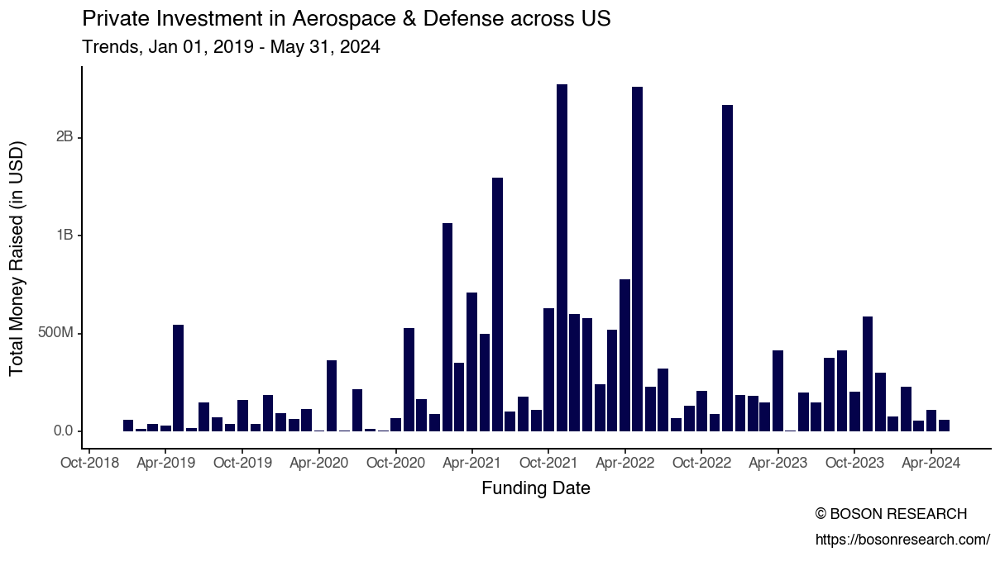

<Figure Size: (604 x 345)>

In [22]:
df_europe_trend = (
    df_europe_raw
    .groupby(['announced_date_trunc_month'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'))
)
df_europe_trend = df_europe_trend.reset_index()
(
    ggplot(df_europe_trend)
    + geom_bar(aes(x="announced_date_trunc_month", y="total_money_raised"), stat="identity", fill = boson_blue) 
    + scale_x_date(date_breaks = "6 month", date_labels =  "%b-%Y") 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Funding Date",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across {}".format(current_region['region_caption']),
        subtitle ="Trends, {} - {}".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)


In [23]:
from datetime import datetime
def to_sector(df):
    sector = None
    if (df['aerospace'] & df['defense']):
        sector = 'aerospace and defense'
    elif df['aerospace']:
        sector = 'aerospace'
    elif df['defense']:
        sector = 'defense'

    return sector

def to_funding_recency(df):
    funding_recency = "older"
    current_year = datetime.now().year
    if (abs(df['announced_year'] - current_year) <= 2):
        funding_recency = "recent"

    return funding_recency


df_europe['sector'] = df_europe.apply(to_sector, axis = 1)

df_europe_raw['sector'] = df_europe_raw.apply(to_sector, axis = 1)
df_europe_raw['funding_recency'] = df_europe_raw.apply(to_funding_recency, axis = 1)

In [24]:
#df_europe.head(2)
df_europe_raw_desc = df_europe_raw.describe()

In [25]:
df_europe_raw['total_funding_usd_format'] = df_europe_raw['total_funding_usd'].apply(add_units)
df_europe_raw.head(2)

,index,name,money_raised,announced_date,industries,description,funding_type,lead_investors,total_funding,city,...,total_funding_amount,money_raised_usd,total_funding_usd,aerospace,defense,announced_date_trunc_month,announced_date_trunc_year,sector,funding_recency,total_funding_usd_format
0,0,SpaceX,$1724965480,2022-05-24,"Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,—,$9779343846,Hawthorne,...,9779343846,1.724965e+09,9.779344e+09,True,False,2022-05-01,2022-01-01,aerospace,recent,10B
1,1,Anduril Industries,$1480000000,2022-12-02,"Aerospace, Government, Military, National Secu...",Anduril Industries is a defense product compan...,Series E,Valor Equity Partners,$2171000000,Costa Mesa,...,2171000000,1.480000e+09,2.171000e+09,True,True,2022-12-01,2022-01-01,aerospace and defense,recent,2B


In [26]:
add_units(df_europe_raw['money_raised_usd'].sum())

'21B'

/Users/dbose/anaconda3/envs/py-data/lib/python3.8/site-packages/plotnine/stats/stat_bin.py:109: PlotnineWarning: 'stat_bin()' using 'bins = 32'. Pick better value with 'binwidth'.


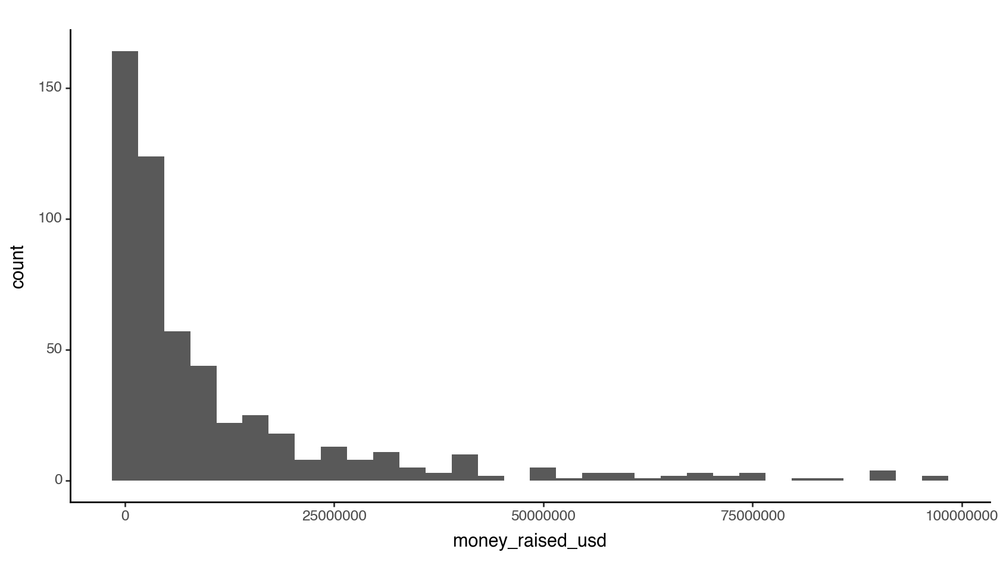

<Figure Size: (840 x 480)>

In [27]:
(
    ggplot(df_europe_raw[df_europe_raw['money_raised_usd']<100000000])
     + geom_histogram(aes(x='money_raised_usd', 
                    y=after_stat("count")))
     + theme_classic()
)

In [28]:
df_info = df_europe_raw.describe()
df_info['total_funding_usd_format'] = df_info['total_funding_usd'].apply(add_units)
df_info

,index,announced_date,announced_year,announced_month,money_raised_usd,total_funding_usd,announced_date_trunc_month,announced_date_trunc_year,total_funding_usd_format
count,586.000000,586,586.000000,586.000000,5.860000e+02,5.860000e+02,586,586,586.0
mean,492.153584,2021-10-26 23:18:13.515358464,2021.337884,6.363481,3.524728e+07,2.048825e+08,2021-10-13 12:54:03.686007040,2021-05-04 00:46:41.365187840,205M
min,0.000000,2019-01-01 00:00:00,2019.000000,1.000000,2.000000e+05,2.000000e+05,2019-01-01 00:00:00,2019-01-01 00:00:00,200k
25%,250.500000,2020-10-01 06:00:00,2020.000000,3.000000,1.300000e+06,4.250000e+06,2020-10-01 00:00:00,2020-01-01 00:00:00,4M
50%,477.500000,2021-11-12 12:00:00,2021.000000,6.000000,5.000000e+06,1.551424e+07,2021-11-01 00:00:00,2021-01-01 00:00:00,16M
75%,746.750000,2022-12-31 18:00:00,2022.750000,10.000000,1.772500e+07,6.273066e+07,2022-12-24 06:00:00,2022-10-01 18:00:00,63M
max,999.000000,2024-05-30 00:00:00,2024.000000,12.000000,1.724965e+09,9.779344e+09,2024-05-01 00:00:00,2024-01-01 00:00:00,10B
std,291.937554,NaN,1.478680,3.631669,1.324487e+08,1.080788e+09,NaN,NaN,1B


### Overall - by Funding Stage

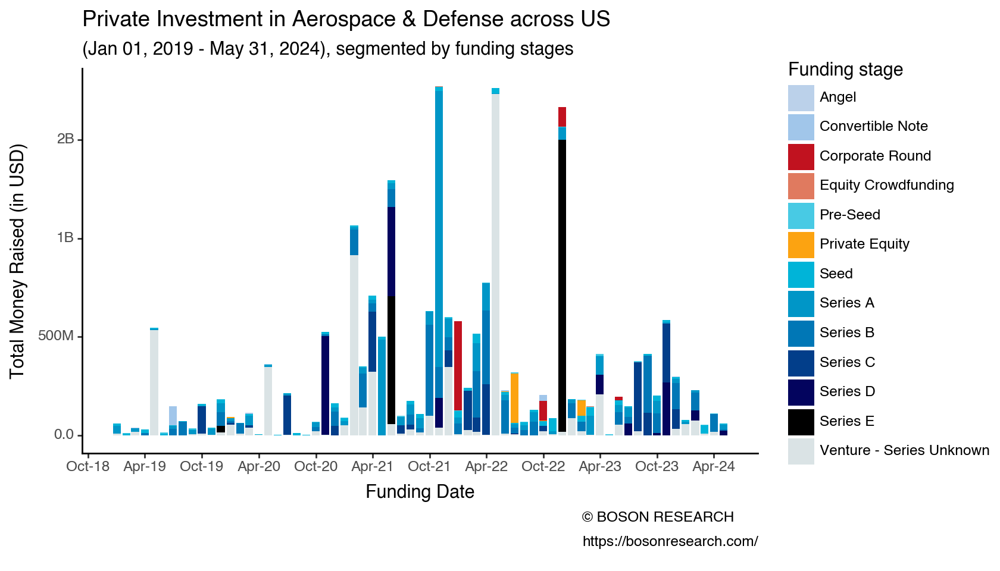

<Figure Size: (840 x 480)>

In [29]:
df_europe_funding_trend_by_funding_stage = (
    df_europe_raw
    .groupby(['funding_type', 'announced_date_trunc_month'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'))
)
df_europe_funding_trend_by_funding_stage = df_europe_funding_trend_by_funding_stage.reset_index()

(
    ggplot(df_europe_funding_trend_by_funding_stage)
    + geom_bar(aes(x="announced_date_trunc_month", 
                   y="total_money_raised", 
                   group = "factor(funding_type)", 
                   fill = "factor(funding_type)"), 
               stat="identity") 
    + scale_x_date(date_breaks = "6 month", date_labels =  "%b-%y") 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + scale_fill_manual(values = funding_stages_color_codes)
    + labs(
        x="Funding Date",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across {}".format(current_region['region_caption']),
        fill="Funding stage",
        subtitle ="({} - {}), segmented by funding stages".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)


In [30]:
GREY_LIGHT = "#b4aea9"
GREY50 = "#7F7F7F"
adjust_text_dict = {
    'EU': {
        'expand': (2, 2),
        'force_text': (0.2, 2),
        'force_static': (0.5, 1.2),
        'force_explode': (0.2, 1.2),
        'arrowprops': {
            'arrowstyle': '->',
            'color': boson_blue_faded
        }
    },
    'US': {
        'arrowprops': {
            'arrowstyle': '->',
            'color': boson_blue_faded
        }
    }
}
outliers = ['SpaceX', 'Anduril Industries', 'Sierra Space']

In [31]:
df_outlier = df_europe_raw[df_europe_raw['name'].isin(outliers)].groupby('name').agg(total_money_raised = ('money_raised_usd', 'sum')).reset_index()
df_outlier['total_money_raised_format'] = df_outlier['total_money_raised'].apply(add_units)
df_outlier

,name,total_money_raised,total_money_raised_format
0,Anduril Industries,2.130000e+09,2B
1,Sierra Space,1.690000e+09,2B
2,SpaceX,4.358265e+09,4B


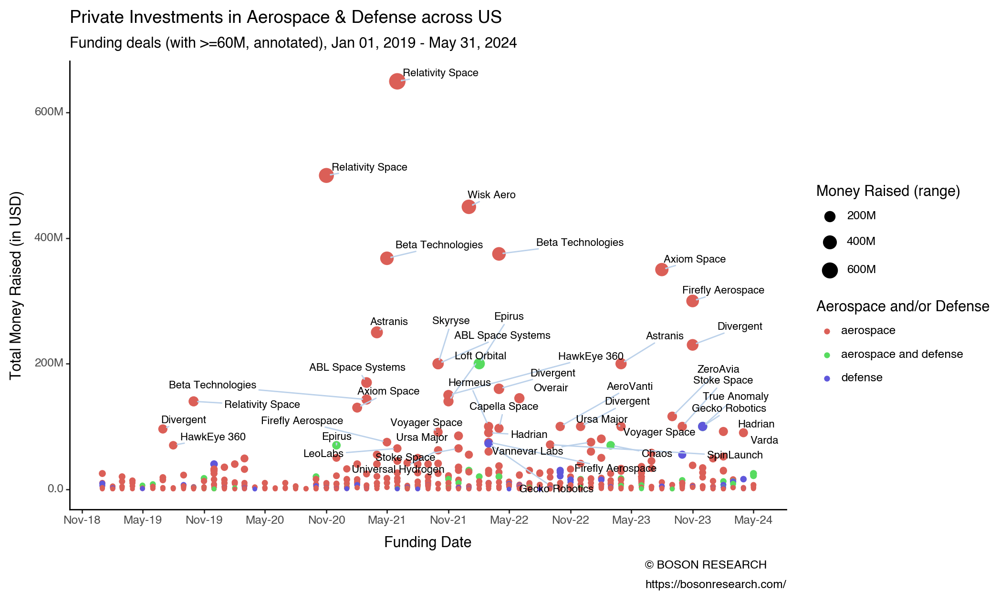

<Figure Size: (1048 x 640)>

In [32]:

options.figure_size = (1048 / options.dpi, 640 / options.dpi)
(
    ggplot(df_europe_raw[~df_europe_raw['name'].isin(outliers)])
    + geom_point(aes(x = "announced_date_trunc_month", 
                     y = "money_raised_usd", 
                     colour = "factor(sector)", 
                     size = "money_raised_usd")) 
    # Annotate startups with >50M funding till date
    + geom_text(aes(x = "announced_date_trunc_month",
                y = "money_raised_usd",
                label = "name"),
                va = "bottom",
                size = 8,
                adjust_text=adjust_text_dict[current_region['region_caption']],
               data=df_europe_raw[(df_europe_raw['money_raised_usd'] > 60000000) & (~df_europe_raw['name'].isin(outliers))])
    + scale_x_date(date_breaks = "6 month", date_labels =  "%b-%y") 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + scale_size_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Funding Date",
        y="Total Money Raised (in USD)",
        title="Private Investments in Aerospace & Defense across {}".format(current_region['region_caption']),
        subtitle ="Funding deals (with >=60M, annotated), {} - {}".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        size="Money Raised (range)",
        colour="Aerospace and/or Defense",
        caption=caption,
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)


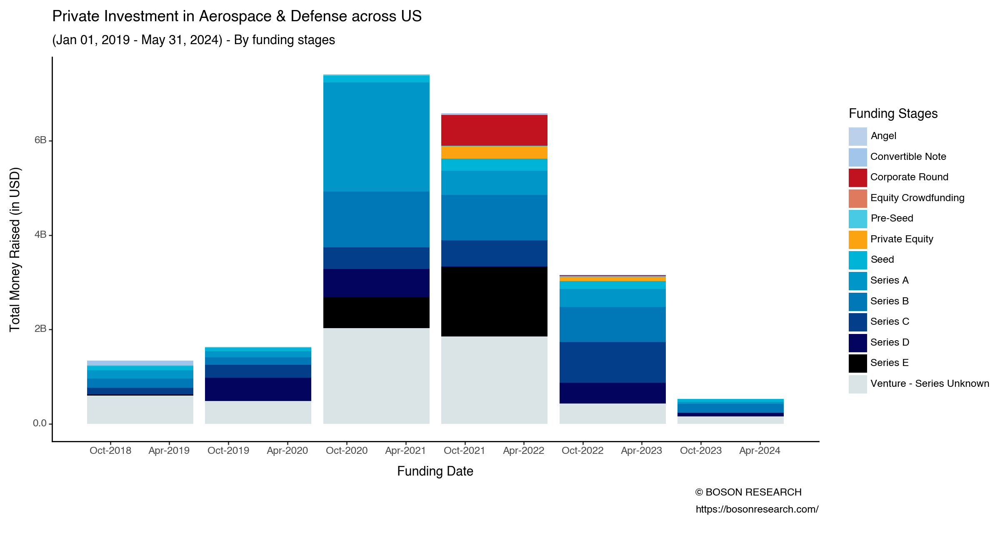

<Figure Size: (1200 x 640)>

In [33]:
df_world_trend = (
    df_europe_raw
    .groupby(['funding_type', 'announced_date_trunc_year'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'))
)
df_world_trend = df_world_trend.reset_index()
df_world_trend = df_world_trend.sort_values(by=["announced_date_trunc_year"])
df_world_trend.head(2)

options.figure_size = (1200 / options.dpi, 640 / options.dpi)
(
    ggplot(df_world_trend)
    + geom_bar(aes(x="announced_date_trunc_year", 
                   y="total_money_raised",
                  group="factor(funding_type)",
                  fill="factor(funding_type)"), 
               stat="identity") 
    + scale_x_date(date_breaks = "6 month", date_labels =  "%b-%Y") 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + scale_fill_manual(values = funding_stages_color_codes)
    + labs(
        x="Funding Date",
        y="Total Money Raised (in USD)",
        fill="Funding Stages",
        title="Private Investment in Aerospace & Defense across {}".format(current_region['region_caption']),
        subtitle ="({} - {}) - By funding stages".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
    
)

### Early-stage investment : Startup stage ($0-15M rounds)

/Users/dbose/anaconda3/envs/py-data/lib/python3.8/site-packages/plotnine/scales/scale_manual.py:45: PlotnineWarning: The palette of scale_fill_manual can return a maximum of 7 values. 11 were requested from it.
/Users/dbose/anaconda3/envs/py-data/lib/python3.8/site-packages/plotnine/scales/scale_manual.py:45: PlotnineWarning: The palette of scale_fill_manual can return a maximum of 7 values. 11 were requested from it.


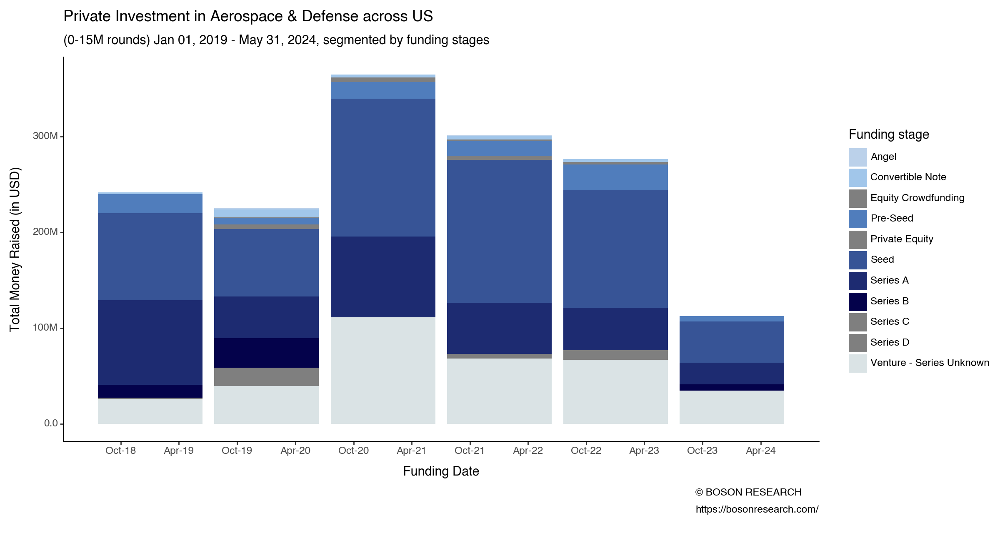

<Figure Size: (1200 x 640)>

In [34]:
df_europe_funding_trend_by_funding_stage = (
    df_europe_raw[df_europe_raw['money_raised_usd'] < 15000000]
    .groupby(['funding_type', 'announced_date_trunc_year'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'))
)
df_europe_funding_trend_by_funding_stage = df_europe_funding_trend_by_funding_stage.reset_index()

options.figure_size = (1200 / options.dpi, 640 / options.dpi)
(
    ggplot(df_europe_funding_trend_by_funding_stage)
    + geom_bar(aes(x="announced_date_trunc_year", 
                   y="total_money_raised", 
                   group = "factor(funding_type)", 
                   fill = "factor(funding_type)"), 
               stat="identity") 
    + scale_x_date(date_breaks = "6 month", date_labels =  "%b-%y") 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + scale_fill_manual(values = startup_stage_color_codes)
    + labs(
        x="Funding Date",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across {}".format(current_region['region_caption']),
        fill="Funding stage",
        subtitle ="(0-15M rounds) {} - {}, segmented by funding stages".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)


### Breakout stage ($15-100M rounds)

/Users/dbose/anaconda3/envs/py-data/lib/python3.8/site-packages/plotnine/scales/scale_manual.py:45: PlotnineWarning: The palette of scale_fill_manual can return a maximum of 5 values. 10 were requested from it.
/Users/dbose/anaconda3/envs/py-data/lib/python3.8/site-packages/plotnine/scales/scale_manual.py:45: PlotnineWarning: The palette of scale_fill_manual can return a maximum of 5 values. 10 were requested from it.


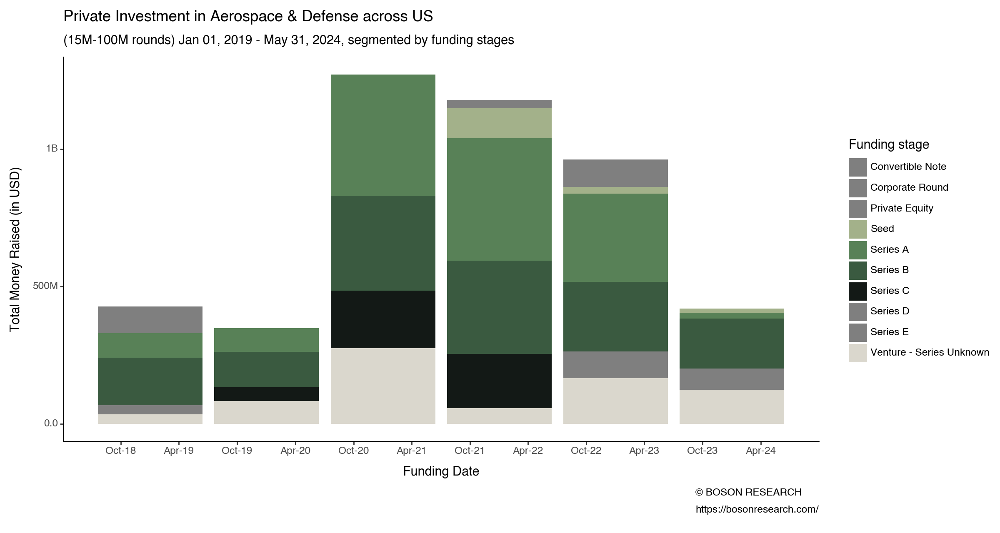

<Figure Size: (1200 x 640)>

In [35]:
df_europe_funding_trend_by_funding_stage = (
    df_europe_raw[(df_europe_raw['money_raised_usd'] > 15000000) & (df_europe_raw['money_raised_usd'] < 100000000)]
    .groupby(['funding_type', 'announced_date_trunc_year'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'))
)
df_europe_funding_trend_by_funding_stage = df_europe_funding_trend_by_funding_stage.reset_index()

options.figure_size = (1200 / options.dpi, 640 / options.dpi)
(
    ggplot(df_europe_funding_trend_by_funding_stage)
    + geom_bar(aes(x="announced_date_trunc_year", 
                   y="total_money_raised", 
                   group = "factor(funding_type)", 
                   fill = "factor(funding_type)"), 
               stat="identity") 
    + scale_x_date(date_breaks = "6 month", date_labels =  "%b-%y") 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    # https://coolors.co/dad7cd-a3b18a-588157-3a5a40-344e41
    + scale_fill_manual(values = breakout_stage_color_codes)
    + labs(
        x="Funding Date",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across {}".format(current_region['region_caption']),
        fill="Funding stage",
        subtitle ="(15M-100M rounds) {} - {}, segmented by funding stages".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)


### Scaleup ($100M+ rounds)

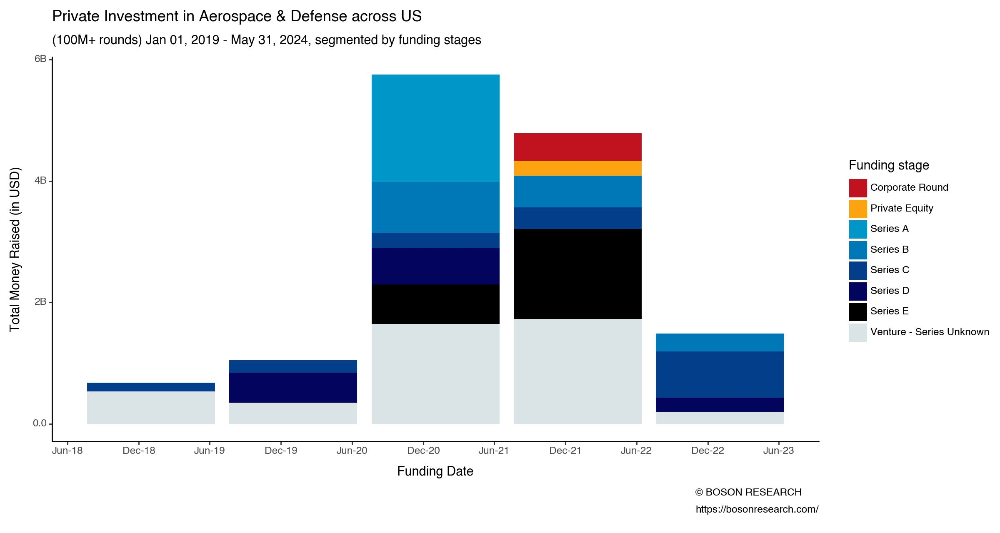

<Figure Size: (1200 x 640)>

In [36]:
df_europe_funding_trend_by_funding_stage = (
    df_europe_raw[(df_europe_raw['money_raised_usd'] > 100000000)]
    .groupby(['funding_type', 'announced_date_trunc_year'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'))
)
df_europe_funding_trend_by_funding_stage = df_europe_funding_trend_by_funding_stage.reset_index()

(
    ggplot(df_europe_funding_trend_by_funding_stage)
    + geom_bar(aes(x="announced_date_trunc_year", 
                   y="total_money_raised", 
                   group = "factor(funding_type)", 
                   fill = "factor(funding_type)"), 
               stat="identity") 
    + scale_x_date(date_breaks = "6 month", date_labels =  "%b-%y") 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    # https://coolors.co/dad7cd-a3b18a-588157-3a5a40-344e41
    + scale_fill_manual(values = funding_stages_color_codes)
    + labs(
        x="Funding Date",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across {}".format(current_region['region_caption']),
        fill="Funding stage",
        subtitle ="(100M+ rounds) {} - {}, segmented by funding stages".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)


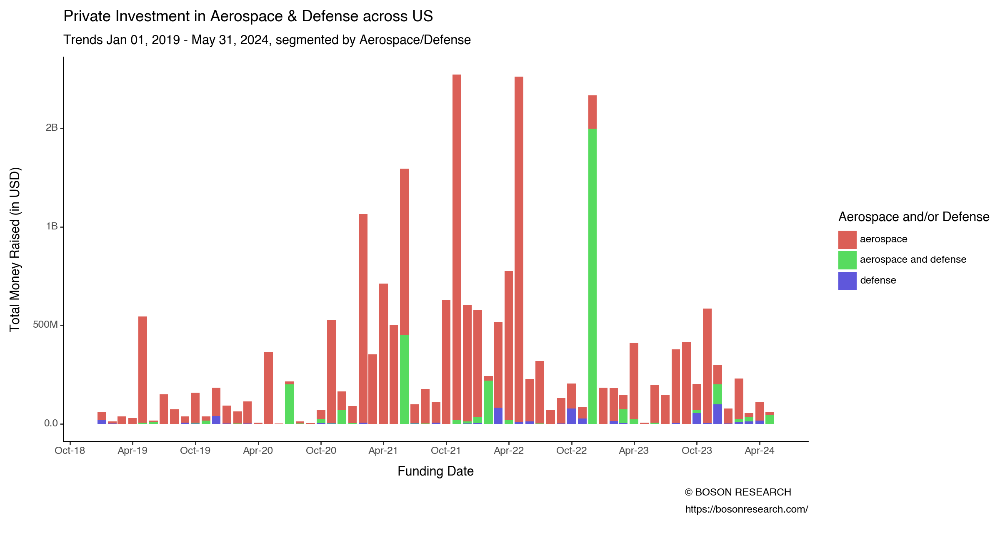

<Figure Size: (1200 x 640)>

In [37]:
df_europe_funding_trend_by_sector = (
    df_europe_raw
    .groupby(['sector', 'announced_date_trunc_month'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'))
)
df_europe_funding_trend_by_sector = df_europe_funding_trend_by_sector.reset_index()

(
    ggplot(df_europe_funding_trend_by_sector)
    + geom_bar(aes(x="announced_date_trunc_month", y="total_money_raised", 
                   group = "factor(sector)", fill = "factor(sector)"), 
               stat="identity") 
    + scale_x_date(date_breaks = "6 month", date_labels =  "%b-%y") 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Funding Date",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across {}".format(current_region['region_caption']),
        fill="Aerospace and/or Defense",
        subtitle ="Trends {} - {}, segmented by Aerospace/Defense".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)


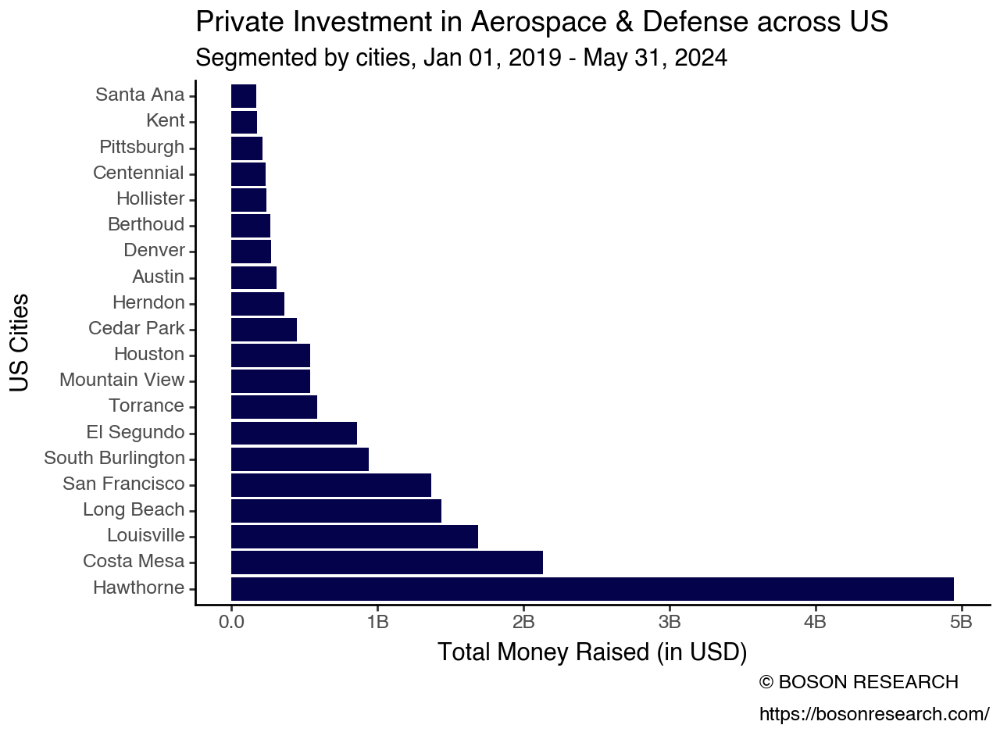

<Figure Size: (640 x 480)>

In [38]:
df_europe_funding_trend_by_city = (
    df_europe
    .groupby(['city'])
    .agg(total_money_raised = ('total_money_raised', 'sum'))
)
df_europe_funding_trend_by_city = df_europe_funding_trend_by_city.reset_index()

# Ordering the bar plot (order city by funding)
df_europe_funding_trend_by_city = df_europe_funding_trend_by_city.sort_values(by = ["total_money_raised"], 
                                                                              ascending=False)
city_by_funding = df_europe_funding_trend_by_city["city"].tolist()
df_europe_funding_trend_by_city = df_europe_funding_trend_by_city.assign(
    city_cat=pd.Categorical(df_europe_funding_trend_by_city["city"], categories=city_by_funding)
)

# # assign to a new column in the DataFrame
options.figure_size = (640 / options.dpi, 480 / options.dpi)
(
    ggplot(df_europe_funding_trend_by_city.head(20))
    + geom_bar(aes(x="city_cat", y="total_money_raised"), 
               stat="identity", fill = boson_blue) 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="{} Cities".format(current_region['region_caption']),
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across {}".format(current_region['region_caption']),
        fill="Aerospace and/or Defense",
        subtitle ="Segmented by cities, {} - {}".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + coord_flip()
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)


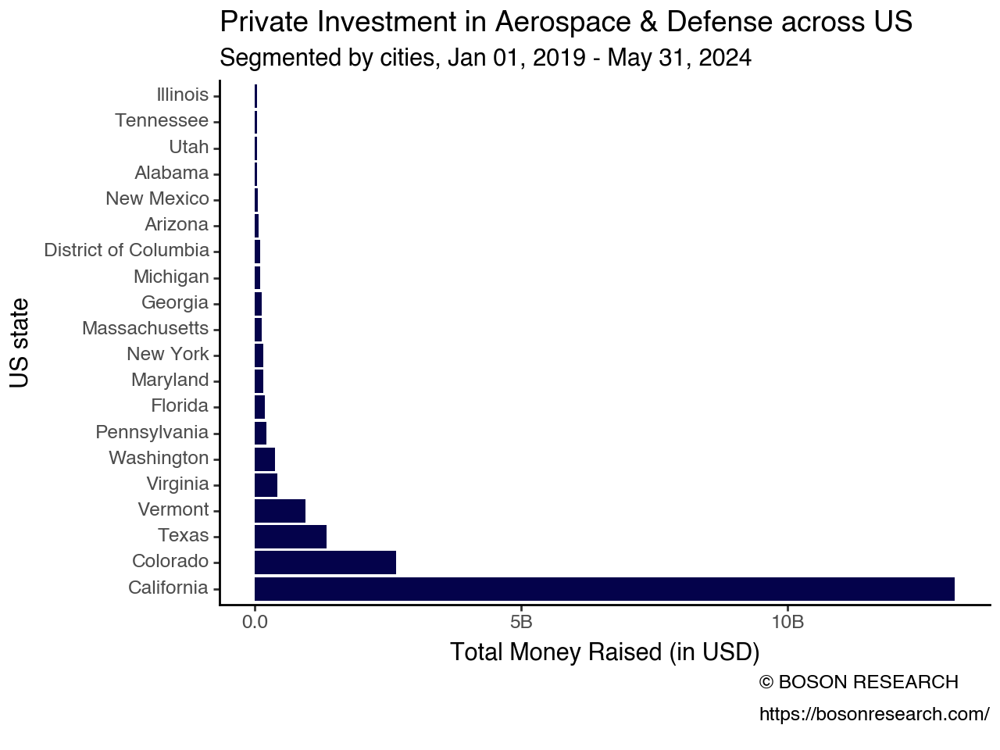

<Figure Size: (640 x 480)>

In [39]:
country_or_state = "state" if current_region['region_caption'] == 'US' else 'country'

df_europe_funding_trend_by_country = (
    df_europe_raw
    .groupby([country_or_state])
    .agg(total_money_raised = ('money_raised_usd', 'sum'))
)
df_europe_funding_trend_by_country = df_europe_funding_trend_by_country.reset_index()

# Ordering the bar plot (order city by funding)
df_europe_funding_trend_by_country = df_europe_funding_trend_by_country.sort_values(by = ["total_money_raised"], 
                                                                              ascending=False)
country_by_funding = df_europe_funding_trend_by_country[country_or_state].tolist()
df_europe_funding_trend_by_country = df_europe_funding_trend_by_country.assign(
    country_or_state_cat = pd.Categorical(df_europe_funding_trend_by_country[country_or_state], 
                                categories=country_by_funding)
)

# # assign to a new column in the DataFrame
options.figure_size = (640 / options.dpi, 480 / options.dpi)
(
    ggplot(df_europe_funding_trend_by_country.head(20))
    + geom_bar(aes(x="country_or_state_cat", y="total_money_raised"), 
               stat="identity", fill = boson_blue) 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="{} {}".format(current_region['region_caption'], country_or_state),
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across {}".format(current_region['region_caption']),
        fill="Aerospace and/or Defense",
        subtitle ="Segmented by cities, {} - {}".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + coord_flip()
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)


In [40]:
df_europe_funding_trend_by_country['total_money_raised_format'] = df_europe_funding_trend_by_country['total_money_raised'].apply(add_units)
df_europe_funding_trend_by_country.head()

,state,total_money_raised,country_or_state_cat,total_money_raised_format
2,California,1.313909e+10,California,13B
3,Colorado,2.658520e+09,Colorado,3B
31,Texas,1.354833e+09,Texas,1B
33,Vermont,9.491627e+08,Vermont,949M
34,Virginia,4.281782e+08,Virginia,428M


In [41]:
df_europe_raw.describe()

,index,announced_date,announced_year,announced_month,money_raised_usd,total_funding_usd,announced_date_trunc_month,announced_date_trunc_year
count,586.000000,586,586.000000,586.000000,5.860000e+02,5.860000e+02,586,586
mean,492.153584,2021-10-26 23:18:13.515358464,2021.337884,6.363481,3.524728e+07,2.048825e+08,2021-10-13 12:54:03.686007040,2021-05-04 00:46:41.365187840
min,0.000000,2019-01-01 00:00:00,2019.000000,1.000000,2.000000e+05,2.000000e+05,2019-01-01 00:00:00,2019-01-01 00:00:00
25%,250.500000,2020-10-01 06:00:00,2020.000000,3.000000,1.300000e+06,4.250000e+06,2020-10-01 00:00:00,2020-01-01 00:00:00
50%,477.500000,2021-11-12 12:00:00,2021.000000,6.000000,5.000000e+06,1.551424e+07,2021-11-01 00:00:00,2021-01-01 00:00:00
75%,746.750000,2022-12-31 18:00:00,2022.750000,10.000000,1.772500e+07,6.273066e+07,2022-12-24 06:00:00,2022-10-01 18:00:00
max,999.000000,2024-05-30 00:00:00,2024.000000,12.000000,1.724965e+09,9.779344e+09,2024-05-01 00:00:00,2024-01-01 00:00:00
std,291.937554,NaN,1.478680,3.631669,1.324487e+08,1.080788e+09,NaN,NaN


### Top companies

In [42]:
df_europe_funding_by_companies = (
    df_europe_raw
    .groupby(['name', 'funding_recency'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'), deals = ('money_raised_usd', 'count'))
)
df_europe_funding_by_companies = df_europe_funding_by_companies.reset_index()

# Ordering the bar plot (order city by funding)
df_europe_funding_by_companies = df_europe_funding_by_companies.sort_values(by = ["total_money_raised"], 
                                                                              ascending=False)
companies_by_funding = df_europe_funding_by_companies["name"].unique()
df_europe_funding_by_companies = df_europe_funding_by_companies.assign(
    company_cat=pd.Categorical(df_europe_funding_by_companies["name"], 
                               categories=companies_by_funding)
)

In [43]:
df6 = df_europe_funding_by_companies.groupby(['name']).agg(total_money_raised = ('total_money_raised', 'sum')).reset_index()
df6['total_money_raised_format'] = df6['total_money_raised'].apply(add_units)
df6_head = df6.sort_values(by=['total_money_raised'], ascending=False).head(15)
','.join([ "{} (${})".format(x,y)  for i, (x, y) in enumerate(zip(df6_head['name'].values, df6_head['total_money_raised_format'].values))])
   

'SpaceX ($4B),Anduril Industries ($2B),Sierra Space ($2B),Relativity Space ($1B),Beta Technologies ($886M),Divergent ($586M),Astranis ($490M),Axiom Space ($487M),Wisk Aero ($450M),Firefly Aerospace ($450M),ABL Space Systems ($419M),HawkEye 360 ($343M),Epirus ($287M),Ursa Major ($264M),ZeroAvia ($240M)'

### Top companies >9M (median) and <27M

In [44]:
df6 = df_europe_funding_by_companies.groupby(['name']).agg(total_money_raised = ('total_money_raised', 'sum')).reset_index()
df6['total_money_raised_format'] = df6['total_money_raised'].apply(add_units)
df7 = df6[(df6['total_money_raised']>9000000) & (df6['total_money_raised']<27000000)]
df7 = df7.sort_values(by=['total_money_raised'], ascending=False)
df7 = df7[['name', 'total_money_raised_format']].rename(columns={'name': 'Name', 
                                                           'total_money_raised_format': 'Total Funding (USD)'}).head(10)
','.join([ "{} (${})".format(x,y)  for i, (x, y) in enumerate(zip(df7['Name'].values, df7['Total Funding (USD)'].values))])

'JetZero ($26M),Karman+ ($26M),Vita Inclinata Technologies ($26M),Hydrosat ($25M),World View Enterprises ($25M),Swarm Technologies ($25M),Geminus ($23M),Electric Power Systems ($22M),General Radar Corp. ($22M),Zeno Power ($22M)'

### Companies at the tail end

In [45]:
df6.sort_values(by=['total_money_raised'], ascending=False).tail(15)

,name,total_money_raised,total_money_raised_format
115,GoApron,350000.0,350k
157,Launchspace,329254.0,329k
280,United Western Group,310200.0,310k
253,Spike Dynamics,280000.0,280k
146,Kall Morris Inc,279000.0,279k
143,Jetoptera,250000.0,250k
152,Kray Technologies,250000.0,250k
166,MOHOC,250000.0,250k
187,OrbitsEdge,250000.0,250k
231,Shuttle,250000.0,250k


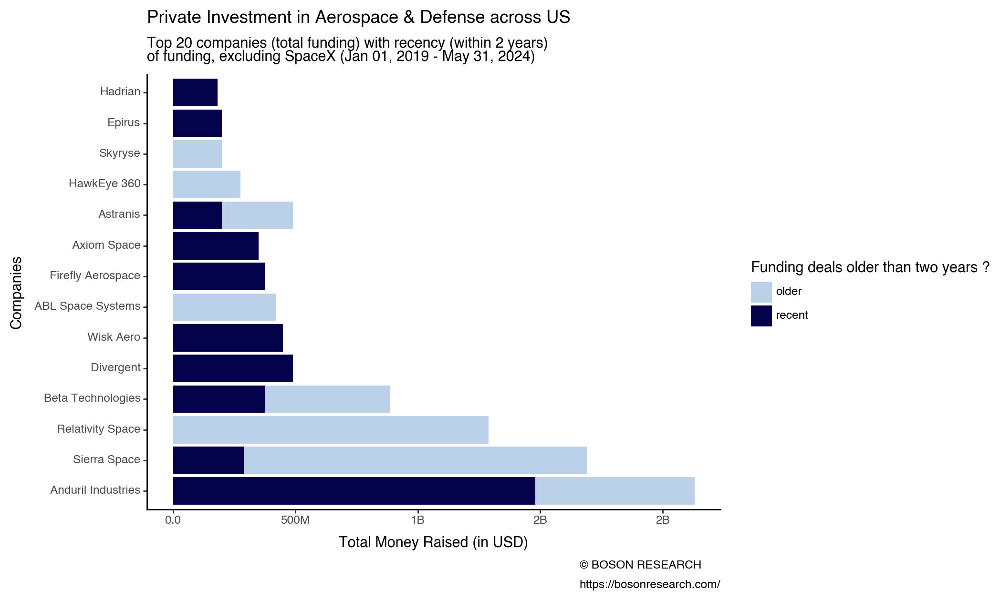

<Figure Size: (1048 x 640)>

In [46]:
n = 20
df_europe_funding_by_companies_top_n = df_europe_funding_by_companies.drop_duplicates().head(n)
options.figure_size = (1048 / options.dpi, 640 / options.dpi)
(
    # [2:] is to remove the top outlier - OneWeb/SpaceX
    ggplot(df_europe_funding_by_companies_top_n[2:])
    + geom_bar(aes(x="company_cat", 
                   y="total_money_raised", 
                   fill = "factor(funding_recency)"), 
               stat="identity") 
    + scale_fill_manual(values = { "older": boson_blue_faded, "recent": boson_blue })
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Companies",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across {}".format(current_region['region_caption']),
        fill="Funding deals older than two years ?",
        subtitle ="Top {} companies (total funding) with recency (within 2 years) \nof funding, excluding {} ({} - {})".format(n, df_europe_funding_by_companies_top_n.loc[df_europe_funding_by_companies_top_n.index[0],'name'], start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + coord_flip()
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)

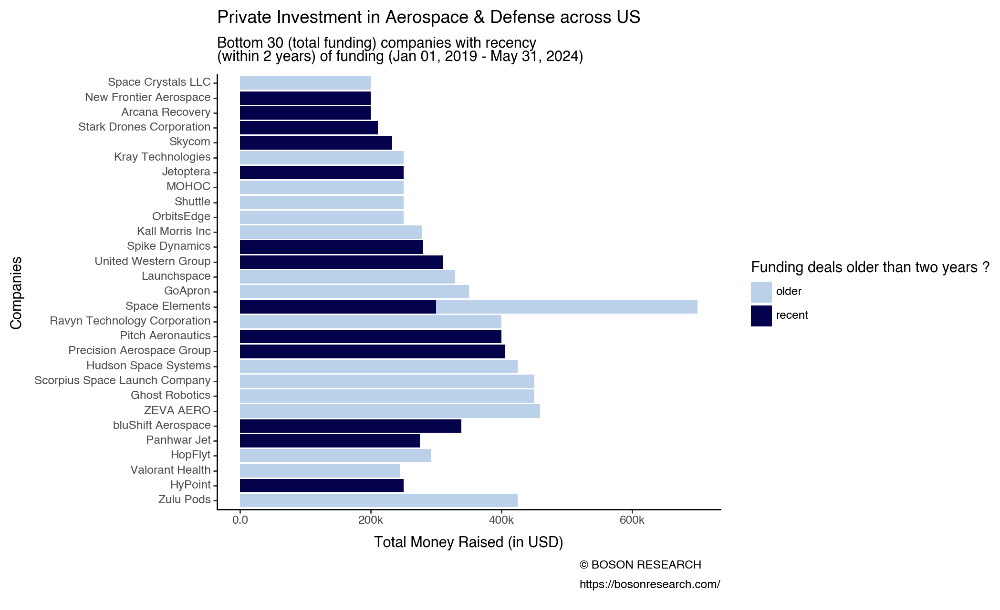

<Figure Size: (1048 x 640)>

In [47]:
# # assign to a new column in the DataFrame

(
    ggplot(df_europe_funding_by_companies.tail(30))
    + geom_bar(aes(x="company_cat", 
                   y="total_money_raised", 
                   fill = "factor(funding_recency)"), 
               stat="identity") 
    + scale_fill_manual(values = { "older": boson_blue_faded, "recent": boson_blue })
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Companies",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across {}".format(current_region['region_caption']),
        fill="Funding deals older than two years ?",
        subtitle ="Bottom 30 (total funding) companies with recency \n(within 2 years) of funding ({} - {})".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + coord_flip()
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)

### Lead Investors

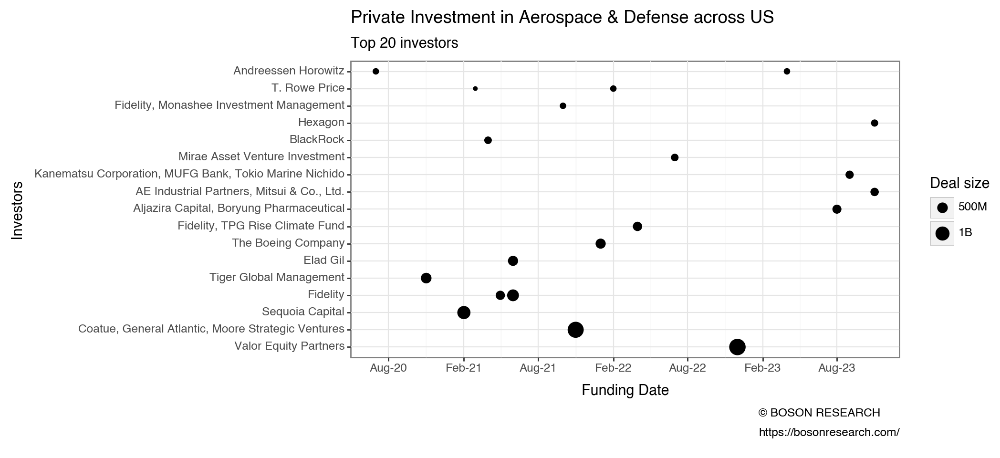

<Figure Size: (1048 x 480)>

In [48]:
df_europe_vc_trend = (
    df_europe_raw
    .groupby(['announced_date_trunc_month', 'lead_investors'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'))
)
df_europe_vc_trend = df_europe_vc_trend.reset_index()
df_europe_vc_trend = df_europe_vc_trend[df_europe_vc_trend['lead_investors'].notna() & (df_europe_vc_trend['lead_investors'] != '—')]

df_europe_vc_trend = df_europe_vc_trend.sort_values(by = ["total_money_raised"], 
                                                    ascending=False)
top_investors = df_europe_vc_trend["lead_investors"].unique()
df_europe_vc_trend = df_europe_vc_trend.assign(
    investors_cat=pd.Categorical(df_europe_vc_trend["lead_investors"], 
                               categories=top_investors)
)
options.figure_size = (1048 / options.dpi, 480 / options.dpi)

(
    ggplot(df_europe_vc_trend.head(20))
    + geom_point(aes(x="announced_date_trunc_month",
                    y="investors_cat",
                    size="total_money_raised"))
    #+ geom_text(aes(label="total_money_raised"), size=9)
    + scale_x_date(date_breaks = "6 month", date_labels =  "%b-%y") 
    + scale_size_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Funding Date",
        y="Investors",
        title="Private Investment in Aerospace & Defense across {}".format(current_region['region_caption']),
        size="Deal size",
        subtitle ="Top 20 investors",
        caption=caption
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"}),
        figure_size=(8, 8)
    )
    + theme_bw()
)



In [49]:
df8 = df_europe_vc_trend.groupby(['lead_investors']).agg(total_money_raised = ('total_money_raised', 'sum')).reset_index()
df8['total_money_raised_format'] = df8['total_money_raised'].apply(add_units)
df8 = df8.sort_values(by=['total_money_raised'], ascending=False)
df8 = df8[['lead_investors', 'total_money_raised_format']].rename(columns={
                                                            'lead_investors': 'Lead Investors',
                                                            'total_money_raised_format': 'Total Money Invested (USD)'
}).head(10)

','.join([ "{} (${})".format(x,y)  for i, (x, y) in enumerate(zip(df8['Lead Investors'].values, df8['Total Money Invested (USD)'].values))])

'Valor Equity Partners ($1B),Coatue, General Atlantic, Moore Strategic Ventures ($1B),Fidelity ($1B),Sequoia Capital ($850M),BlackRock ($527M),Tiger Global Management ($517M),Elad Gil ($450M),The Boeing Company ($450M),Andreessen Horowitz ($410M),Fidelity, TPG Rise Climate Fund ($375M)'

# US / Europe 

In [50]:
df_world_raw = (
    df[(df['aerospace'] | df['defense'])]
)

df_world_raw = df_world_raw[df_world_raw['money_raised_usd'] > 0]
df_world_raw = df_world_raw.reset_index()

df_world_raw['sector'] = df_world_raw.apply(to_sector, axis = 1)
df_world_raw['funding_recency'] = df_world_raw.apply(to_funding_recency, axis = 1)

df_world_raw.head(2)

,index,name,money_raised,announced_date,industries,description,funding_type,lead_investors,total_funding,city,...,total_funding_currency,total_funding_amount,money_raised_usd,total_funding_usd,aerospace,defense,announced_date_trunc_month,announced_date_trunc_year,sector,funding_recency
0,0,SpaceX,$1724965480,2022-05-24,"Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,—,$9779343846,Hawthorne,...,$,9779343846,1.724965e+09,9.779344e+09,True,False,2022-05-01,2022-01-01,aerospace,recent
1,1,Anduril Industries,$1480000000,2022-12-02,"Aerospace, Government, Military, National Secu...",Anduril Industries is a defense product compan...,Series E,Valor Equity Partners,$2171000000,Costa Mesa,...,$,2171000000,1.480000e+09,2.171000e+09,True,True,2022-12-01,2022-01-01,aerospace and defense,recent


In [51]:
options.figure_size = (1048 / options.dpi, 620 / options.dpi)
df_world_trend = (
    df_world_raw
    .groupby(['announced_date_trunc_year'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'))
)
df_world_trend = df_world_trend.reset_index()
df_world_trend = df_world_trend.sort_values(by=["announced_date_trunc_year"])
df_world_trend.head(2)

,announced_date_trunc_year,total_money_raised
0,2019-01-01,2.778901e+09
1,2020-01-01,1.992270e+09


In [52]:
# Since 2019
first_year_money_raised = df_world_trend.iloc[0, 1]
last_year_money_raised = df_world_trend.iloc[-1, 1]
years = round((df_world_trend.iloc[-1, 0] - df_world_trend.iloc[0, 0])/pd.Timedelta(days=365),2)
CAGR = (last_year_money_raised/first_year_money_raised)**(1./years)-1
"Investment CAGR since 2019: {}%".format(round(CAGR * 100))

'Investment CAGR since 2019: -20%'

In [53]:
# Since 2021
first_year_money_raised = df_world_trend.iloc[2, 1]
last_year_money_raised = df_world_trend.iloc[-1, 1]
years = round((df_world_trend.iloc[-1, 0] - df_world_trend.iloc[0, 0])/pd.Timedelta(days=365),2)
CAGR = (last_year_money_raised/first_year_money_raised)**(1./years)-1
"Investment CAGR since 2021: {}%".format(round(CAGR * 100))

'Investment CAGR since 2021: -38%'

In [54]:
df_t = df_world_trend.copy()
df_t = df_t['total_money_raised'].apply(add_units)
df_t.head(10)

0      3B
1      2B
2     10B
3      8B
4      4B
5    928M
Name: total_money_raised, dtype: object

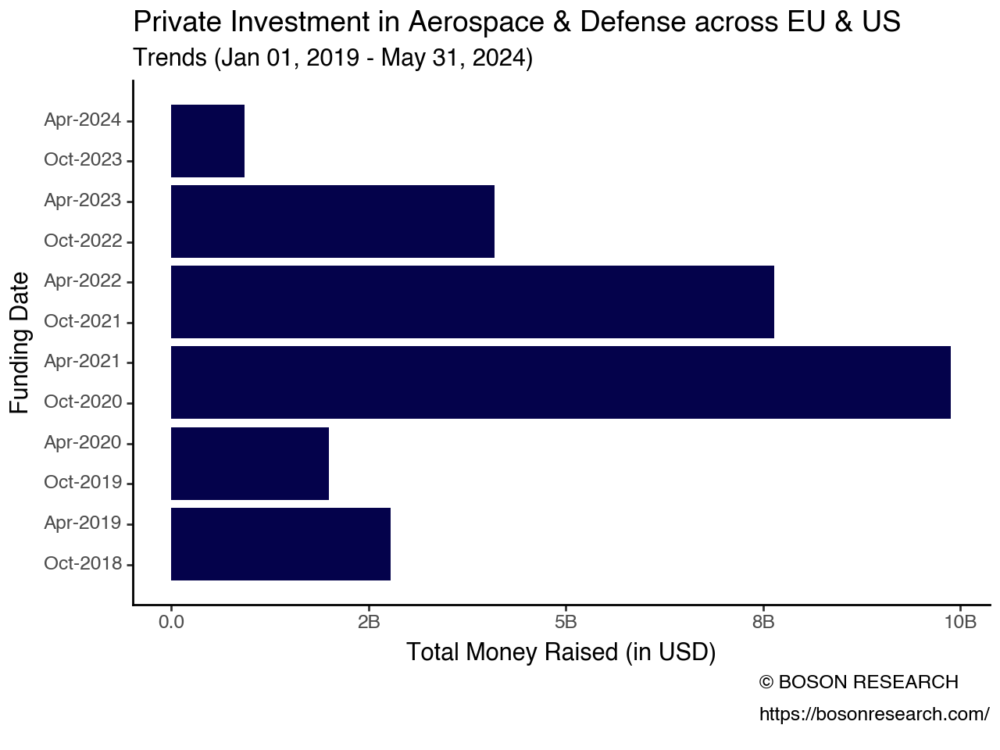

<Figure Size: (640 x 480)>

In [55]:
options.figure_size = (640 / options.dpi, 480 / options.dpi)
(
    ggplot(df_world_trend)
    + geom_bar(aes(x="announced_date_trunc_year", 
                   y="total_money_raised"), 
               stat="identity", 
               fill = boson_blue) 
    + scale_x_date(date_breaks = "6 month", date_labels =  "%b-%Y") 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Funding Date",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across EU & US",
        subtitle ="Trends ({} - {})".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
    + coord_flip()
)

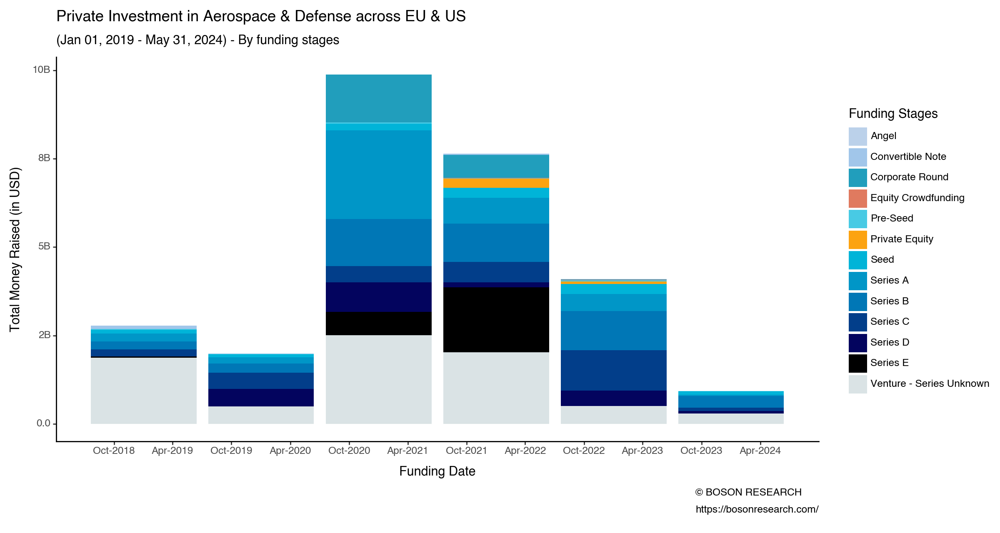

<Figure Size: (1200 x 640)>

In [56]:
df_world_trend = (
    df_world_raw
    .groupby(['funding_type', 'announced_date_trunc_year'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'))
)
df_world_trend = df_world_trend.reset_index()
df_world_trend = df_world_trend.sort_values(by=["announced_date_trunc_year"])
df_world_trend.head(2)

options.figure_size = (1200 / options.dpi, 640 / options.dpi)
(
    ggplot(df_world_trend)
    + geom_bar(aes(x="announced_date_trunc_year", 
                   y="total_money_raised",
                  group="factor(funding_type)",
                  fill="factor(funding_type)"), 
               stat="identity") 
    + scale_x_date(date_breaks = "6 month", date_labels =  "%b-%Y") 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + scale_fill_manual(values = { 
        "Angel": "#bbd1ea", 
        "Convertible Note": "#a1c6ea",
        "Corporate Round": "#219ebc",
        "Equity Crowdfunding": "#e07a5f",
        "Pre-Seed": "#48cae4",
        "Seed": "#00b4d8",
        "Series A": "#0096c7",
        "Series B": "#0077b6",
        "Series C": "#023e8a",
        "Series D": "#03045e",
        "Series E": "#000000",
        "Private Equity": "#fca311",
        "Venture - Series Unknown": "#dae3e5" })
    + labs(
        x="Funding Date",
        y="Total Money Raised (in USD)",
        fill="Funding Stages",
        title="Private Investment in Aerospace & Defense across EU & US",
        subtitle ="({} - {}) - By funding stages".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
    
)

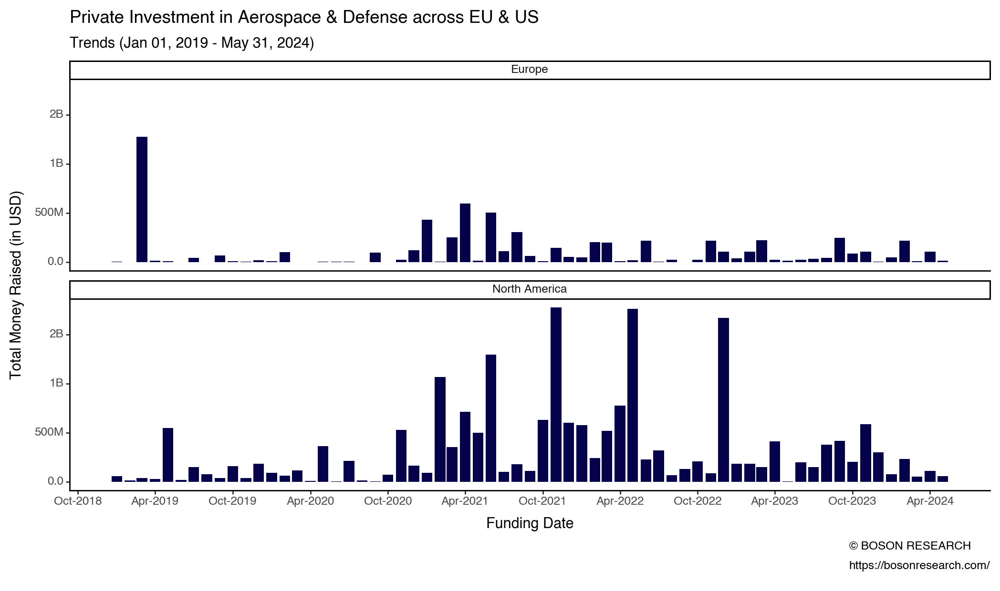

<Figure Size: (1048 x 620)>

In [57]:
options.figure_size = (1048 / options.dpi, 620 / options.dpi)
df_world_trend = (
    df_world_raw
    .groupby(['region', 'announced_date_trunc_month'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'))
)
df_world_trend = df_world_trend.reset_index()
(
    ggplot(df_world_trend)
    + geom_bar(aes(x="announced_date_trunc_month", 
                   y="total_money_raised"), 
               stat="identity", 
               fill = boson_blue) 
    + scale_x_date(date_breaks = "6 month", date_labels =  "%b-%Y") 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Funding Date",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across EU & US",
        subtitle ="Trends ({} - {})".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
    + facet_wrap("region", nrow=2)
)

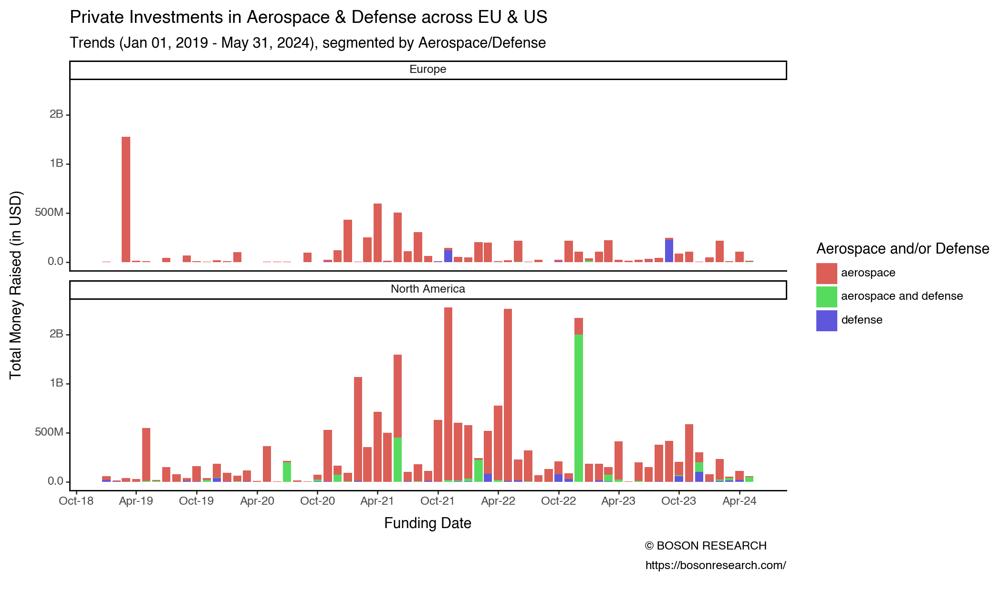

<Figure Size: (1048 x 620)>

In [58]:
df_world_funding_trend_by_sector = (
    df_world_raw
    .groupby(['region', 'sector', 'announced_date_trunc_month'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'))
)
df_world_funding_trend_by_sector = df_world_funding_trend_by_sector.reset_index()

(
    ggplot(df_world_funding_trend_by_sector)
    + geom_bar(aes(x="announced_date_trunc_month", y="total_money_raised", 
                   group = "factor(sector)", fill = "factor(sector)"), 
               stat="identity") 
    + scale_x_date(date_breaks = "6 month", date_labels =  "%b-%y") 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Funding Date",
        y="Total Money Raised (in USD)",
        title="Private Investments in Aerospace & Defense across EU & US",
        fill="Aerospace and/or Defense",
        subtitle ="Trends ({} - {}), segmented by Aerospace/Defense".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
    + facet_wrap("region", nrow=2)
)

In [59]:
df_america_raw = df_world_raw[df_world_raw['region'] == 'North America']

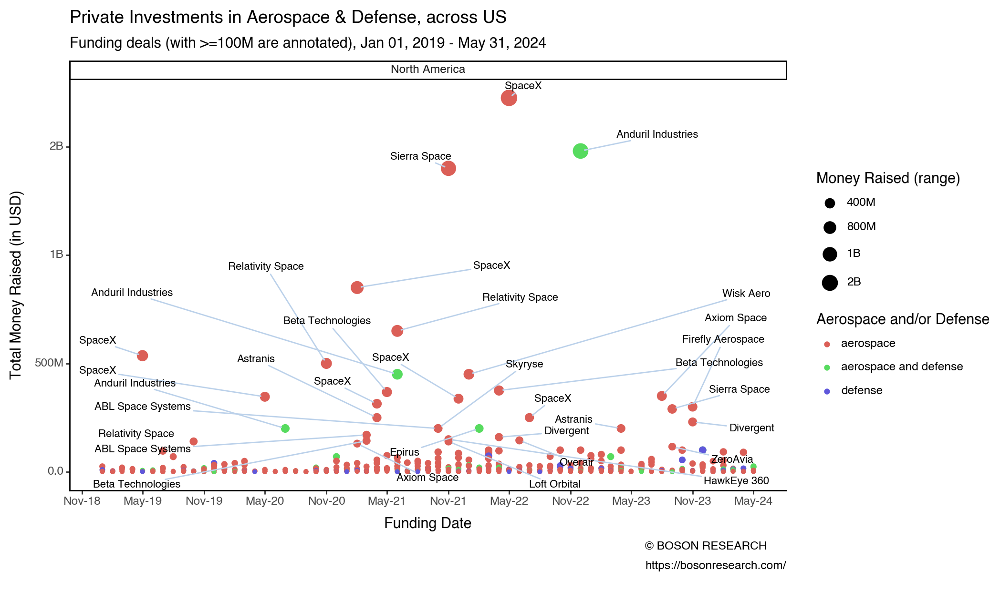

<Figure Size: (1048 x 620)>

In [60]:
GREY_LIGHT = "#b4aea9"
GREY50 = "#7F7F7F"
adjust_text_dict_us = {
    'expand': (2, 2),
    'force_text': (0.2, 0.2),
    'force_static': (0.5, 0.5),
    #'force_explode': (0.2, 0.5),
    'arrowprops': {
        'arrowstyle': '->',
        'color': boson_blue_faded
    }
}

(
    ggplot(df_america_raw)
    + geom_point(aes(x = "announced_date_trunc_month", 
                     y = "money_raised_usd", 
                     colour = "factor(sector)", 
                     size = "money_raised_usd")) 
    + facet_wrap("region", nrow=2)
    # Annotate startups with >50M funding till date
    + geom_text(aes(x = "announced_date_trunc_month",
                y = "money_raised_usd",
                label = "name"),
                va = "bottom",
                size = 8,
                adjust_text=adjust_text_dict_us,
               data=df_america_raw[df_america_raw['money_raised_usd'] > 100000000])
    + scale_x_date(date_breaks = "6 month", date_labels =  "%b-%y") 
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + scale_size_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Funding Date",
        y="Total Money Raised (in USD)",
        title="Private Investments in Aerospace & Defense, across US",
        subtitle ="Funding deals (with >=100M are annotated), {} - {}".format(start_date.strftime('%b %d, %Y'),end_date.strftime('%b %d, %Y')),
        size="Money Raised (range)",
        colour="Aerospace and/or Defense",
        caption=caption,
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)


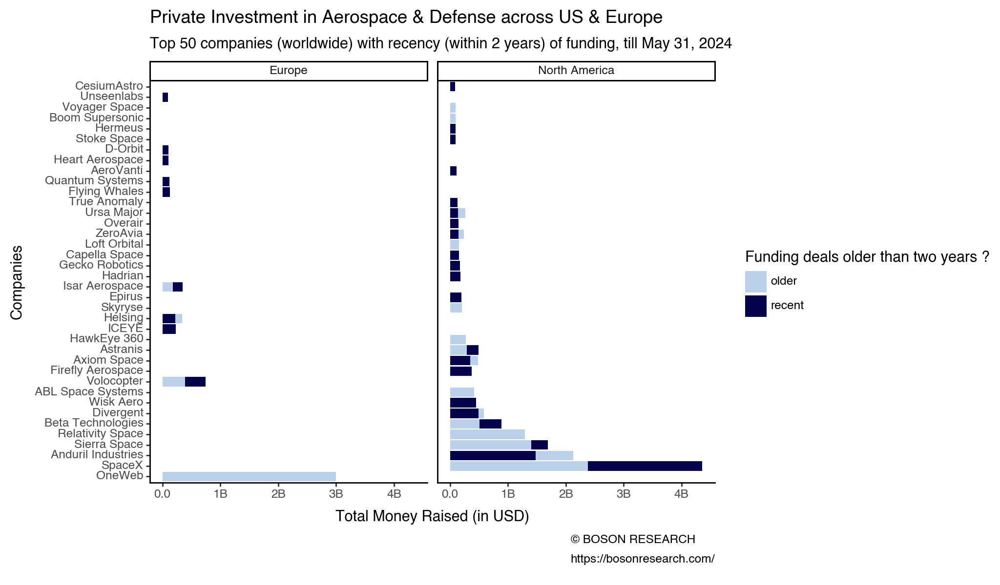

<Figure Size: (1024 x 600)>

In [61]:
df_world_funding_by_companies = (
    df_world_raw
    .groupby(['region', 'name', 'funding_recency'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'), deals = ('money_raised_usd', 'count'))
)
df_world_funding_by_companies = df_world_funding_by_companies.reset_index()

# Ordering the bar plot (order city by funding)
df_world_funding_by_companies = df_world_funding_by_companies.sort_values(by = ["total_money_raised"], 
                                                                              ascending=False)
world_companies = df_world_funding_by_companies["name"].unique()
df_world_funding_by_companies = df_world_funding_by_companies.assign(
    company_cat=pd.Categorical(df_world_funding_by_companies["name"], 
                               categories=world_companies)
)

options.figure_size = (1024 / options.dpi, 600 / options.dpi)
(
    ggplot(df_world_funding_by_companies.head(50))
    + geom_bar(aes(x="company_cat", 
                   y="total_money_raised", 
                   group="region",
                   fill = "factor(funding_recency)"), 
               stat="identity") 
    + scale_fill_manual(values = { "older": boson_blue_faded, "recent": boson_blue })
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Companies",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across US & Europe",
        fill="Funding deals older than two years ?",
        subtitle ="Top 50 companies (worldwide) with recency (within 2 years) of funding, till {}".format(end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + coord_flip()
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
    + facet_wrap("region")
)

In [62]:
median_funding_world = df_world_funding_by_companies['total_money_raised'].median()
median_funding_world

5953705.0

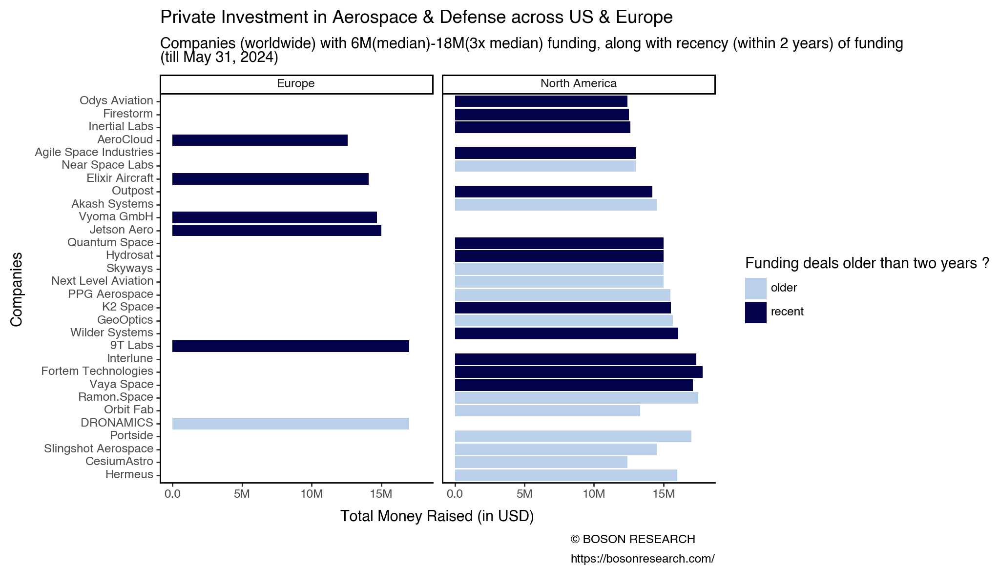

<Figure Size: (1024 x 600)>

In [63]:
df_world_limit = df_world_funding_by_companies[(df_world_funding_by_companies['total_money_raised'] > median_funding_world) &
                        (df_world_funding_by_companies['total_money_raised'] < 3*median_funding_world)]

(
    ggplot(df_world_limit.head(30))
    + geom_bar(aes(x="company_cat", 
                   y="total_money_raised", 
                   group="region",
                   fill = "factor(funding_recency)"), 
               stat="identity") 
    + scale_fill_manual(values = { "older": boson_blue_faded, "recent": boson_blue })
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Companies",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across US & Europe",
        fill="Funding deals older than two years ?",
        subtitle ="Companies (worldwide) with {}(median)-{}(3x median) funding, along with recency (within 2 years) of funding \n(till {})".format(add_units(median_funding_world), add_units(3*median_funding_world), end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + coord_flip()
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
    + facet_wrap("region")
)

## CAGR in Deal Value - Preparing a derived dataset

In [126]:
df_spacex = df_world_raw[df_world_raw['name'] == 'Hadrian']


'Andreessen Horowitz, Lux Capital,Founders Fund'

In [127]:
# def weighted_average(data):
#     d = {}
#     d['d1_wa'] = np.average(data['d1'], weights=data['weights'])
#     d['d2_wa'] = np.average(data['d2'], weights=data['weights'])
#     return pd.Series(d)
# Call the groupby apply method with our custom function:

# df.groupby('group').apply(weighted_average)

#        d1_wa  d2_wa
# group              
# a        9.0    2.2
# b       58.0   13.2

def first_last_deal_flow(data):
    d = {}
    data_sorted = data.sort_values(by = ["announced_date"])
    d['first_deal_value'] = data_sorted.loc[data_sorted.index[0], 'money_raised_usd']
    d['first_deal_date'] = data_sorted.loc[data_sorted.index[0], 'announced_date']
    d['last_deal_value'] = data_sorted.loc[data_sorted.index[-1], 'money_raised_usd']
    d['last_deal_date'] = data_sorted.loc[data_sorted.index[-1], 'announced_date']
    d['last_deal_year'] = data_sorted.loc[data_sorted.index[-1], 'announced_year']
    d['deal_span_years'] = round((d['last_deal_date'] - d['first_deal_date'])/pd.Timedelta(days=365),2)
    d['total_funding_usd'] = data_sorted.loc[data_sorted.index[0], 'total_funding_usd']
    d['city'] = data_sorted.loc[data_sorted.index[0], 'city']
    d['country'] = data_sorted.loc[data_sorted.index[0], 'country']
    d['region'] = data_sorted.loc[data_sorted.index[0], 'region']
    d['sector'] = data_sorted.loc[data_sorted.index[0], 'sector']
    d['lead_investors'] = ','.join(pd.Series(data_sorted['lead_investors'].str.split(",").explode().unique()).where(lambda x: x != "—").dropna())
    d['industries'] = data_sorted.loc[data_sorted.index[0], 'industries']
    d['deals'] = len(data_sorted)
    d['funding_recency'] = "recent" if (abs(d['last_deal_year'] - datetime.now().year) <= 2) else "older"
    d['deal_growth_cagr'] = round((d['last_deal_value']/d['first_deal_value'])**(1./d['deal_span_years'])-1,
                                  2)*100 if d['deal_span_years'] > 0 else 0
    return pd.Series(d)

df_world_first_last_deal_values = ( 
    df_world_raw
    .groupby(['name'])
    .apply(first_last_deal_flow)
)

# Ignore outliers - top 2 percentile
df_world_first_last_deal_values['deal_growth_cagr'] = df_world_first_last_deal_values['deal_growth_cagr'].clip(upper=df_world_first_last_deal_values['deal_growth_cagr'].quantile(0.98))

# Sort
df_world_first_last_deal_values = df_world_first_last_deal_values.sort_values(by = ["deal_growth_cagr", 
                                                                                    "total_funding_usd", 
                                                                                    "last_deal_date"], 
                                                                              ascending=False)

df_world_first_last_deal_values = df_world_first_last_deal_values.reset_index()
df_world_first_last_deal_values.head(10)

,name,first_deal_value,first_deal_date,last_deal_value,last_deal_date,last_deal_year,deal_span_years,total_funding_usd,city,country,region,sector,lead_investors,industries,deals,funding_recency,deal_growth_cagr
0,Skyryse,2500000.0,2020-05-15,200000000.0,2021-10-27,2021,1.45,240500000.0,El Segundo,United States,North America,aerospace,"Fidelity, Monashee Investment Management","[Aerospace, Air Transportation, Internet, Transportation]",2,older,1066.4
1,AeroVanti,9750000.0,2022-07-21,100000000.0,2022-10-19,2022,0.25,109750000.0,Annapolis,United States,North America,aerospace,Network 1 Financial Securities,"[Aerospace, Air Transportation, Transportation]",2,recent,1066.4
2,BRINC,2200000.0,2020-10-29,55000000.0,2022-01-01,2022,1.18,82200000.0,Seattle,United States,North America,aerospace,"Sam Altman,Index Ventures,Alameda Research","[Aerospace, Drones, Law Enforcement, Public Safety, Robotics]",3,recent,1066.4
3,AKHAN Semiconductor,1949083.0,2021-11-08,20000000.0,2022-02-17,2022,0.28,37919412.0,Gurnee,United States,North America,aerospace and defense,,"[Aerospace, Automotive, Consumer Electronics, Manufacturing, Military, Semiconductor, Telecommunications]",3,recent,1066.4
4,Phantom Space,875000.0,2020-09-11,21630605.0,2021-11-04,2021,1.15,27655605.0,Tucson,United States,North America,aerospace,Chenel Capital,"[Aerospace, Space Travel, Transportation]",3,older,1066.4
5,Karman+,1000000.0,2022-01-01,25000000.0,2023-03-01,2023,1.16,26000000.0,Denver,United States,North America,aerospace,,"[Aerospace, Robotics]",2,recent,1066.4
6,Apogee Semiconductor,468792.0,2022-07-21,8606581.0,2023-04-19,2023,0.75,10373924.0,Plano,United States,North America,aerospace,,"[Aerospace, Industrial Manufacturing, Semiconductor]",2,recent,1066.4
7,Radical,500000.0,2023-04-05,4465000.0,2024-01-05,2024,0.75,4965000.0,Seattle,United States,North America,aerospace,"Y Combinator,Scout Ventures","[Aerospace, Internet, Telecommunications]",2,recent,1066.4
8,Basalt Tech,500000.0,2024-04-03,3500000.0,2024-05-30,2024,0.16,4000000.0,San Francisco,United States,North America,aerospace,"Y Combinator,Initialized Capital","[Aerospace, Industrial Automation, Space Travel]",2,recent,1066.4
9,The Exploration Company,1740300.0,2021-10-05,43576000.0,2023-02-01,2023,1.33,54297360.0,Munich,Germany,Europe,aerospace,"Promus Ventures,EQT Ventures, Red River West","[Aerospace, Air Transportation, Manufacturing, Space Travel]",3,recent,1026.0


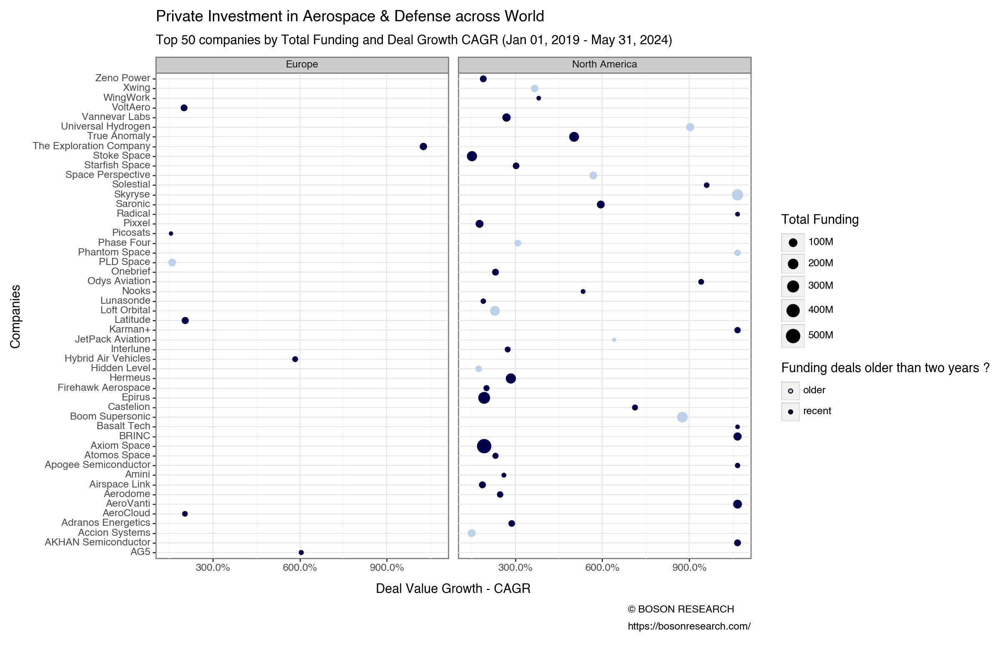

<Figure Size: (1200 x 780)>

In [66]:
options.figure_size = (1200 / options.dpi, 780 / options.dpi)

(
    ggplot(df_world_first_last_deal_values.head(50))
    + geom_point(aes(x="name",
                    y="deal_growth_cagr",
                    size="total_funding_usd",
                    group="region",
                    fill="factor(funding_recency)",
                    colour="factor(funding_recency)"))
    #+ geom_text(aes(label="total_money_raised"), size=9)
    + scale_y_continuous(labels = lambda l: ['{}%'.format(v) for v in l])
    + scale_size_continuous(labels = lambda l: [add_units(v) for v in l])
    + scale_fill_manual(values = { "older": boson_blue_faded, "recent": boson_blue })
    + scale_colour_manual(values = { "older": boson_blue_faded, "recent": boson_blue }, guide=False)
    + labs(
        x="Companies",
        y="Deal Value Growth - CAGR",
        title="Private Investment in Aerospace & Defense across World",
        size="Total Funding",
        fill="Funding deals older than two years ?",
        subtitle ="Top 50 companies by Total Funding and Deal Growth CAGR ({} - {})".format(start_date.strftime('%b %d, %Y'), end_date.strftime('%b %d, %Y')),
        caption=caption
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"}),
        figure_size=(8, 8)
    )
    + coord_flip() 
    + facet_wrap("region")
    + theme_bw()
)

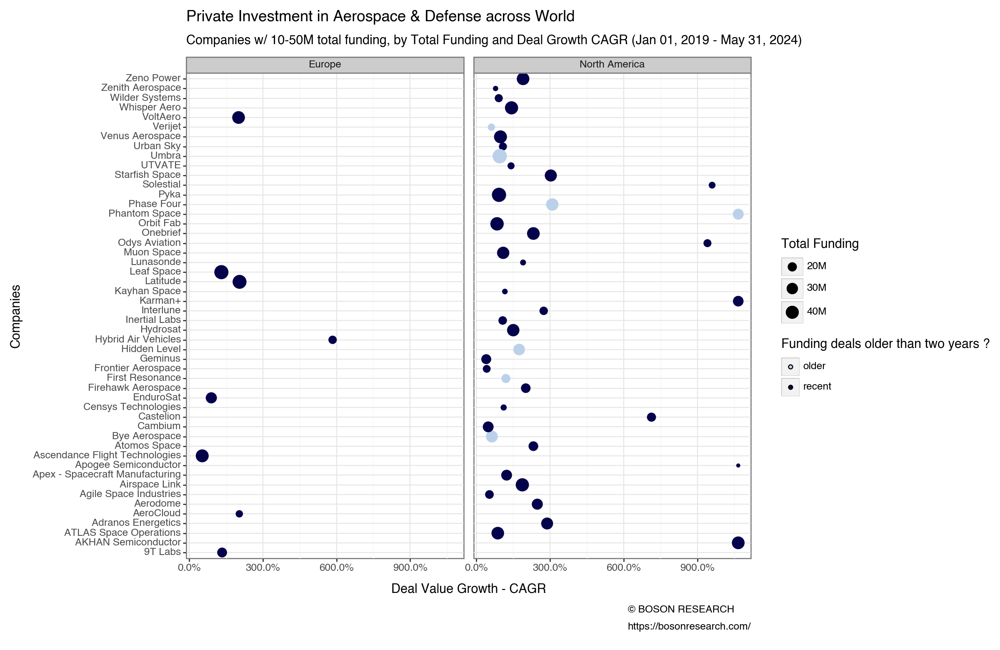

<Figure Size: (1200 x 780)>

In [67]:
options.figure_size = (1200 / options.dpi, 780 / options.dpi)

(
    ggplot(df_world_first_last_deal_values[(df_world_first_last_deal_values['total_funding_usd']>10000000) & 
           (df_world_first_last_deal_values['total_funding_usd']<50000000)].head(50))
    + geom_point(aes(x="name",
                    y="deal_growth_cagr",
                    size="total_funding_usd",
                    group="region",
                    fill="factor(funding_recency)",
                    colour="factor(funding_recency)"))
    #+ geom_text(aes(label="total_money_raised"), size=9)
    + scale_y_continuous(labels = lambda l: ['{}%'.format(v) for v in l])
    + scale_size_continuous(labels = lambda l: [add_units(v) for v in l])
    + scale_fill_manual(values = { "older": boson_blue_faded, "recent": boson_blue })
    + scale_colour_manual(values = { "older": boson_blue_faded, "recent": boson_blue }, 
                          guide=False)
    + labs(
        x="Companies",
        y="Deal Value Growth - CAGR",
        title="Private Investment in Aerospace & Defense across World",
        size="Total Funding",
        fill="Funding deals older than two years ?",
        subtitle ="Companies w/ 10-50M total funding, by Total Funding and Deal Growth CAGR ({} - {})".format(start_date.strftime('%b %d, %Y'), end_date.strftime('%b %d, %Y')),
        caption=caption
    )
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"}),
        figure_size=(8, 8)
    )
    + coord_flip() 
    + facet_wrap("region")
    + theme_bw()
)

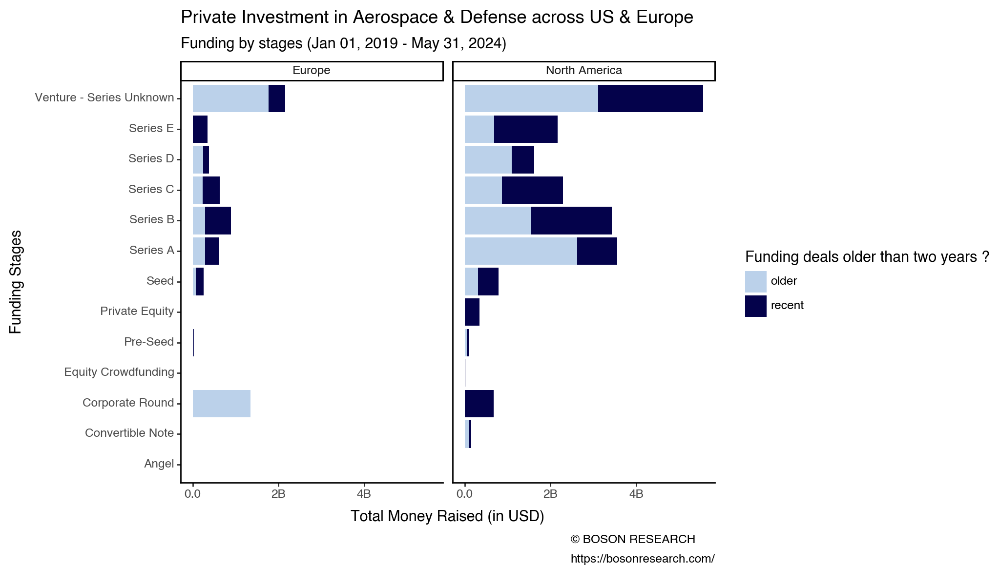

<Figure Size: (1024 x 600)>

In [68]:
df_world_funding_by_stage = (
    df_world_raw
    .groupby(['region', 'funding_type', 'funding_recency'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'), deals = ('money_raised_usd', 'count'))
)
df_world_funding_by_stage = df_world_funding_by_stage.reset_index()

options.figure_size = (1024 / options.dpi, 600 / options.dpi)
(
    ggplot(df_world_funding_by_stage)
    + geom_bar(aes(x="funding_type", 
                   y="total_money_raised", 
                   group="region",
                   fill = "factor(funding_recency)"),
               
               stat="identity") 
    + scale_fill_manual(values = { "older": boson_blue_faded, "recent": boson_blue })
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Funding Stages",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across US & Europe",
        fill="Funding deals older than two years ?",
        subtitle ="Funding by stages ({} - {})".format(start_date.strftime('%b %d, %Y'), end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + coord_flip()
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
    + facet_wrap("region")
)

In [69]:
df_world_funding_by_countries = (
    df_world_raw
    .groupby(['region', 'country', 'funding_recency'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'), deals = ('money_raised_usd', 'count'))
)
df_world_funding_by_countries = df_world_funding_by_countries.reset_index()
df_world_funding_by_countries.head(5)

,region,country,funding_recency,total_money_raised,deals
0,Europe,Austria,older,22542000.0,1
1,Europe,Austria,recent,204462.0,1
2,Europe,Belgium,older,56542900.0,4
3,Europe,Belgium,recent,75873000.0,3
4,Europe,Bulgaria,older,4453420.0,2


### Military spending to GDP
Source: https://data.worldbank.org/indicator/MS.MIL.XPND.GD.ZS?end=2022&start=2022&view=bar

In [70]:
military_to_gdp_df = pd.read_csv("Military_to_GDP.csv")
military_to_gdp_df = military_to_gdp_df[['Country Name', '2022']]
military_to_gdp_df.rename(columns = {"Country Name": "country", "2022": "military_spending_to_gdp"}, 
                          inplace=True)
military_to_gdp_df = military_to_gdp_df.dropna()
military_to_gdp_df.head(5)

,country,military_spending_to_gdp
1,Africa Eastern and Southern,1.001660
3,Africa Western and Central,0.975188
4,Angola,1.328722
5,Albania,1.584881
7,Arab World,4.968286


In [71]:
df_world_funding_and_spending_by_countries = df_world_funding_by_countries.merge(military_to_gdp_df, on = "country")
df_world_funding_and_spending_by_countries['military_spending_to_gdp'] = pd.to_numeric(df_world_funding_and_spending_by_countries['military_spending_to_gdp'])
df_world_funding_and_spending_by_countries.head(5)

,region,country,funding_recency,total_money_raised,deals,military_spending_to_gdp
0,Europe,Austria,older,22542000.0,1,0.772607
1,Europe,Austria,recent,204462.0,1,0.772607
2,Europe,Belgium,older,56542900.0,4,1.179737
3,Europe,Belgium,recent,75873000.0,3,1.179737
4,Europe,Bulgaria,older,4453420.0,2,1.508123


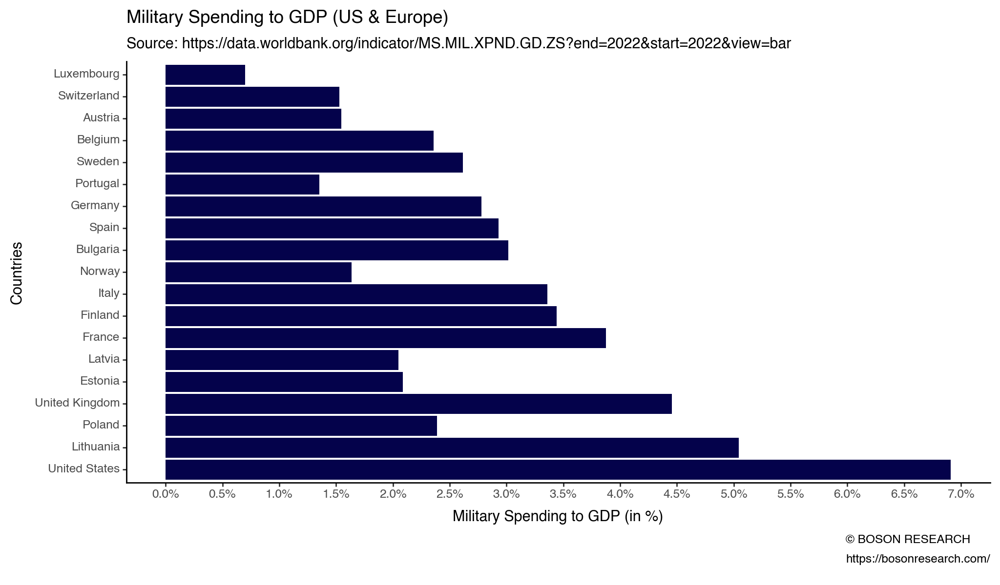

<Figure Size: (1024 x 600)>

In [72]:
# Ordering the bar plot
df_world_funding_and_spending_by_countries = df_world_funding_and_spending_by_countries.sort_values(by = "military_spending_to_gdp", 
                                                                          ascending=False)
countries_by_funding = df_world_funding_and_spending_by_countries["country"].unique()
df_world_funding_and_spending_by_countries = df_world_funding_and_spending_by_countries.assign(
    country_cat=pd.Categorical(df_world_funding_and_spending_by_countries["country"], 
                               categories=countries_by_funding)
)

options.figure_size = (1024 / options.dpi, 600 / options.dpi)
(
    ggplot(df_world_funding_and_spending_by_countries[1:])
    + geom_bar(aes(x="country_cat",
                   y="military_spending_to_gdp"),
               fill=boson_blue,
               stat="identity") 
    #+ scale_fill_manual(values = { "older": boson_blue_faded, "recent": boson_blue })
    + scale_y_continuous(breaks = list([x * .5 for x in range(20)]), 
                         labels = lambda l: ["{}%".format(v) for v in l])
    + labs(
        x="Countries",
        y="Military Spending to GDP (in %)",
        title="Military Spending to GDP (US & Europe)",
        fill="Funding deals older than two years ?",
        subtitle ="Source: https://data.worldbank.org/indicator/MS.MIL.XPND.GD.ZS?end=2022&start=2022&view=bar",
        caption=caption,
    )
    + coord_flip()
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)

In [73]:
df_world_funding_and_spending_by_countries.head(2)

,region,country,funding_recency,total_money_raised,deals,military_spending_to_gdp,country_cat
28,Europe,Ukraine,older,3.500000e+05,1,33.546573,Ukraine
32,North America,United States,recent,1.026982e+10,273,3.454920,United States


In [74]:
df_world_funding_by_countries = (
    df_world_funding_and_spending_by_countries
    .groupby(["funding_recency", "country"])
    .agg(total_money_raised = ('total_money_raised', 'sum'))
    .sort_values(by=["total_money_raised"], 
                 ascending=False)
)
df_world_funding_by_countries = df_world_funding_by_countries.reset_index()
df_world_funding_by_countries.head(5)

,funding_recency,country,total_money_raised
0,older,United States,1.038508e+10
1,recent,United States,1.026982e+10
2,older,United Kingdom,3.027402e+09
3,recent,Germany,1.091632e+09
4,older,Germany,7.439148e+08


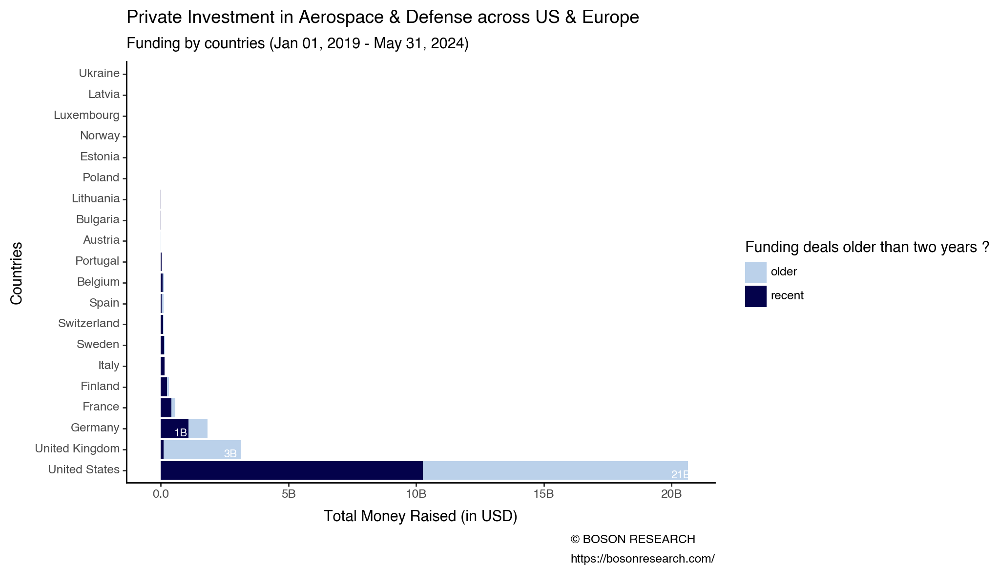

<Figure Size: (1024 x 600)>

In [75]:
# Ordering the bar plot
df_world_funding_by_countries = df_world_funding_by_countries.sort_values(by = "total_money_raised", 
                                                                          ascending=False)
countries_by_funding = df_world_funding_by_countries["country"].unique()
df_world_funding_by_countries = df_world_funding_by_countries.assign(
    country_cat=pd.Categorical(df_world_funding_by_countries["country"], 
                               categories=countries_by_funding)
)

options.figure_size = (1024 / options.dpi, 600 / options.dpi)

# Annotate >1B countries
df_labels = df_world_funding_by_countries[df_world_funding_by_countries['total_money_raised'] > 1000000000]
df_labels = (
    df_labels
    .groupby(["country_cat"])
    .agg(total_money_raised = ('total_money_raised', 'sum'))
    .reset_index()
)
df_labels['total_money_raised_format'] = df_labels['total_money_raised'].apply(add_units)

(
    ggplot(df_world_funding_by_countries)
    + geom_bar(aes(x="country_cat", 
                   y="total_money_raised",
                  fill="factor(funding_recency)"),
               stat="identity") 
    + geom_text(aes(x = "country_cat",
                    y = "total_money_raised - 300000000",
                    label = "total_money_raised_format"),
                color="white",
                va = "top",
                size = 8,
               data=df_labels)
    + scale_fill_manual(values = { "older": boson_blue_faded, "recent": boson_blue })
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Countries",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across US & Europe",
        fill="Funding deals older than two years ?",
        subtitle ="Funding by countries ({} - {})".format(start_date.strftime('%b %d, %Y'), end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + coord_flip()
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)

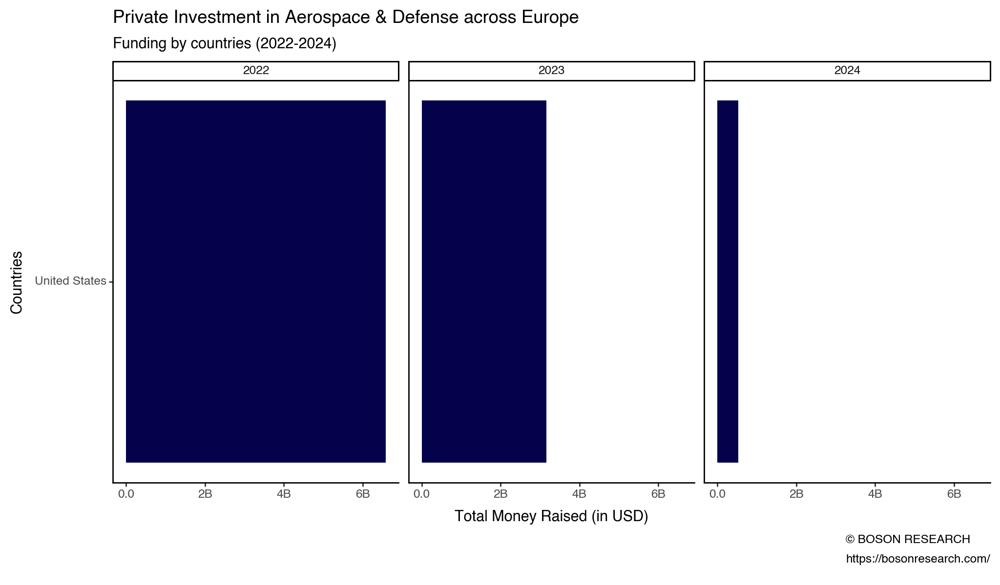

<Figure Size: (1024 x 600)>

In [76]:
df_world_funding_by_countries = (
    df_world_raw
    .groupby(['region', 'country', 'announced_year'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'), deals = ('money_raised_usd', 'count'))
)
df_world_funding_by_countries = df_world_funding_by_countries.reset_index()

df_europe_funding_by_countries = (
    df_world_funding_by_countries[
        (df_world_funding_by_countries['region'] == current_region['region']) & 
        ((df_world_funding_by_countries['announced_year'] >= 2022))
    ]
    .groupby(["country", "announced_year"])
    .agg(total_money_raised = ('total_money_raised', 'sum'))
    .sort_values(by=["total_money_raised"], 
                 ascending=False)
)
df_europe_funding_by_countries = df_europe_funding_by_countries.reset_index()

# Ordering the bar plot
df_europe_funding_by_countries = df_europe_funding_by_countries.sort_values(by = "total_money_raised", 
                                                                          ascending=False)
countries_by_funding = df_europe_funding_by_countries["country"].unique()
df_europe_funding_by_countries = df_europe_funding_by_countries.assign(
    country_cat=pd.Categorical(df_europe_funding_by_countries["country"], 
                               categories=countries_by_funding)
)

df_labels = (
    df_world_raw[
        (df_world_raw['region'] == current_region['region']) & 
        (df_world_raw['announced_year'] >= 2022)
    ]
    .groupby(['country', 'name'])
    .agg(total_money_raised = ('money_raised_usd', 'sum'), deals = ('money_raised_usd', 'count'))
)
df_labels = df_labels.reset_index()
df_labels = df_labels.assign(
    country_cat=pd.Categorical(df_labels["country"], 
                               categories=countries_by_funding)
)


(
    ggplot(df_europe_funding_by_countries)
    + geom_bar(aes(x="country_cat", 
                   y="total_money_raised"),
               stat="identity",
              fill=boson_blue)
    # + geom_text(aes(x = "country_cat",
    #             y = "total_money_raised * 1.2 + 1000000",
    #             label = "name"),
    #             va = "bottom",
    #             size = 8,
    #             nudge_y = 0.5,
    #             colour="#780000",
    #             #adjust_text=adjust_text_dict,
    #            data=df_labels[df_labels['total_money_raised'] > 100000000])
    + scale_y_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Countries",
        y="Total Money Raised (in USD)",
        title="Private Investment in Aerospace & Defense across Europe",
        subtitle ="Funding by countries (2022-2024)",
        caption=caption,
    )
    + coord_flip()
    + facet_wrap("announced_year", ncol=3)
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)

In [77]:
df_labels.sort_values(by=['total_money_raised'], ascending=False).head(20)

,country,name,total_money_raised,deals,country_cat
157,United States,SpaceX,1.974965e+09,2,United States
17,United States,Anduril Industries,1.480000e+09,1,United States
55,United States,Divergent,4.900000e+08,3,United States
195,United States,Wisk Aero,4.500000e+08,1,United States
37,United States,Beta Technologies,3.750000e+08,1,United States
67,United States,Firefly Aerospace,3.750000e+08,2,United States
32,United States,Axiom Space,3.500000e+08,1,United States
150,United States,Sierra Space,2.900000e+08,1,United States
62,United States,Epirus,2.000000e+08,1,United States
24,United States,Astranis,2.000000e+08,1,United States


In [78]:
df_world_spending_by_countries = (
    df_world_funding_and_spending_by_countries
    .groupby(["country"])
    .agg(military_spending_to_gdp = ('military_spending_to_gdp', 'sum'))
    .sort_values(by=["military_spending_to_gdp"], 
                 ascending=False)
)
df_world_spending_by_countries = df_world_spending_by_countries.reset_index()

countries_by_spending = df_world_spending_by_countries["country"].unique()
df_world_spending_by_countries = df_world_spending_by_countries.assign(
    country_cat=pd.Categorical(df_world_spending_by_countries["country"], 
                               categories=countries_by_spending)
)
df_world_spending_by_countries.head(5)

,country,military_spending_to_gdp,country_cat
0,Ukraine,33.546573,Ukraine
1,United States,6.909840,United States
2,Lithuania,5.045247,Lithuania
3,United Kingdom,4.454368,United Kingdom
4,France,3.877447,France


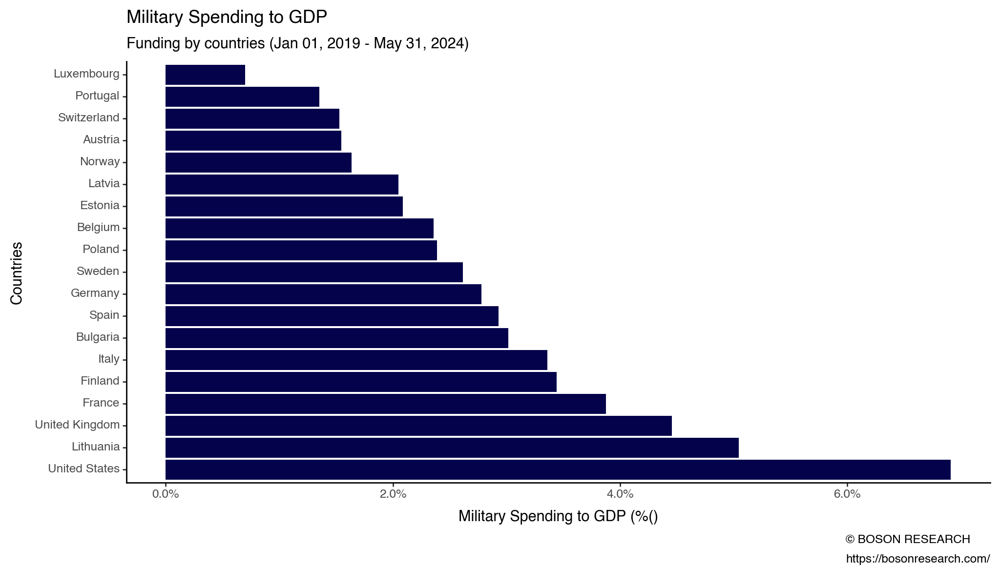

<Figure Size: (1024 x 600)>

In [79]:
(
    ggplot(df_world_spending_by_countries[1:])
    + geom_bar(aes(x="country_cat", 
                   y="military_spending_to_gdp"),
               stat="identity",
            fill=boson_blue) 
    #+ scale_fill_manual(values = { "older": boson_blue_faded, "recent": boson_blue })
    + scale_y_continuous(labels = lambda l: ['{}%'.format(v) for v in l])
    + labs(
        x="Countries",
        y="Military Spending to GDP (%()",
        title="Military Spending to GDP",
        fill="Funding deals older than two years ?",
        subtitle ="Funding by countries ({} - {})".format(start_date.strftime('%b %d, %Y'), end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + coord_flip()
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_classic()
)

In [80]:
df_world_raw.head(2)

,index,name,money_raised,announced_date,industries,description,funding_type,lead_investors,total_funding,city,...,total_funding_currency,total_funding_amount,money_raised_usd,total_funding_usd,aerospace,defense,announced_date_trunc_month,announced_date_trunc_year,sector,funding_recency
0,0,SpaceX,$1724965480,2022-05-24,"Advanced Materials, Aerospace, Manufacturing, ...",SpaceX is an aviation and aerospace company th...,Venture - Series Unknown,—,$9779343846,Hawthorne,...,$,9779343846,1.724965e+09,9.779344e+09,True,False,2022-05-01,2022-01-01,aerospace,recent
1,1,Anduril Industries,$1480000000,2022-12-02,"Aerospace, Government, Military, National Secu...",Anduril Industries is a defense product compan...,Series E,Valor Equity Partners,$2171000000,Costa Mesa,...,$,2171000000,1.480000e+09,2.171000e+09,True,True,2022-12-01,2022-01-01,aerospace and defense,recent


In [81]:
df_world_raw['industries'] = df_world_raw['industries'].str.split(",")

In [82]:
df_world_raw_exploded = df_world_raw.explode('industries')
df_world_raw_exploded['industries'] = df_world_raw_exploded['industries'].str.strip()

df_world_raw_exploded_agg_by_industries = (
    df_world_raw_exploded
    .groupby(['industries'])
    .agg(money_raised_usd = ('money_raised_usd', 'sum'))
)
df_world_raw_exploded_agg_by_industries = (
    df_world_raw_exploded_agg_by_industries
    .reset_index()
)
# df_world_raw_exploded_agg_by_industries.head(2)


df_world_raw_exploded_agg_by_industries['money_raised_usd_format'] = df_world_raw_exploded_agg_by_industries['money_raised_usd'].apply(add_units)
df_world_raw_exploded_agg_by_industries.head(5)

,industries,money_raised_usd,money_raised_usd_format
0,3D Printing,6.628812e+08,663M
1,3D Technology,1.342485e+09,1B
2,Advanced Materials,6.570686e+09,7B
3,Aerospace,2.641824e+10,26B
4,AgTech,7.591975e+07,76M


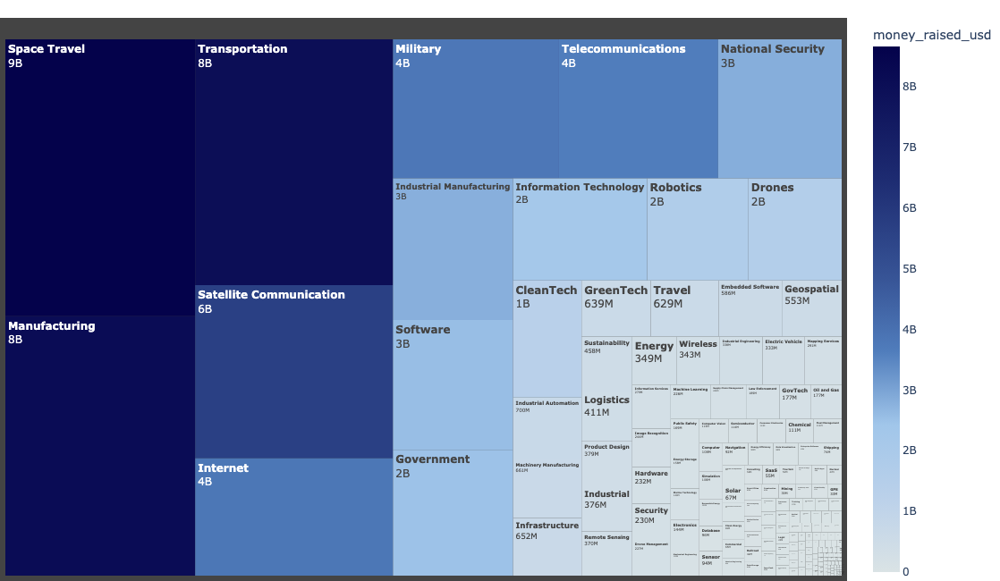

In [83]:
import plotly.express as px
import plotly.io as pio
pio.renderers.default = "plotly_mimetype+notebook"

boson_blue = "#04024B"
boson_royal = "#1d2b71"
boson_yinmin = '#375496'
boson_glaucous = '#507dbc'
boson_powder_blue = '#a1c6ea'
boson_columbia_blue = '#bbd1ea'
boson_blue_faded = '#dae3e5'

fig = px.treemap(df_world_raw_exploded_agg_by_industries[20:], 
                 path=['industries'],
                 values='money_raised_usd',
                 color='money_raised_usd',
                
                 # https://coolors.co/generate
                 # https://coolors.co/04024b-1d2b71-375496-507dbc-a1c6ea-bbd1ea-dae3e5
                 color_continuous_scale=[(0,boson_blue_faded),
                                         (0.14, boson_columbia_blue),
                                         (0.28, boson_powder_blue),
                                         (0.42, boson_glaucous),
                                         (0.56, boson_yinmin),
                                         (0.75, boson_royal),
                                         (1,boson_blue)],

                 custom_data=['money_raised_usd_format'],
                 
                 width=1200, 
                 height=650)
fig.update_layout(margin = dict(t=20, l=0, r=0, b=0))
fig.update_traces(marker = dict(
                    line = dict(width = 0)
                  ),
                 tiling = dict(pad = 0))
fig.data[0].texttemplate = "<b>%{label}</b><br>%{customdata[0]}"
fig.show()

### CAGR by sub-sectors

In [84]:
df_world_first_last_deal_values.head(5)

,name,first_deal_value,first_deal_date,last_deal_value,last_deal_date,last_deal_year,deal_span_years,total_funding_usd,city,country,region,sector,lead_investors,industries,deals,funding_recency,deal_growth_cagr
0,Skyryse,2500000.0,2020-05-15,200000000.0,2021-10-27,2021,1.45,240500000.0,El Segundo,United States,North America,aerospace,—,"Aerospace, Air Transportation, Internet, Trans...",2,older,1066.4
1,AeroVanti,9750000.0,2022-07-21,100000000.0,2022-10-19,2022,0.25,109750000.0,Annapolis,United States,North America,aerospace,Network 1 Financial Securities,"Aerospace, Air Transportation, Transportation",2,recent,1066.4
2,BRINC,2200000.0,2020-10-29,55000000.0,2022-01-01,2022,1.18,82200000.0,Seattle,United States,North America,aerospace,Sam Altman,"Aerospace, Drones, Law Enforcement, Public Saf...",3,recent,1066.4
3,AKHAN Semiconductor,1949083.0,2021-11-08,20000000.0,2022-02-17,2022,0.28,37919412.0,Gurnee,United States,North America,aerospace and defense,—,"Aerospace, Automotive, Consumer Electronics, M...",3,recent,1066.4
4,Phantom Space,875000.0,2020-09-11,21630605.0,2021-11-04,2021,1.15,27655605.0,Tucson,United States,North America,aerospace,—,"Aerospace, Space Travel, Transportation",3,older,1066.4


In [85]:
#df_world_first_last_deal_values['industries'] = df_world_first_last_deal_values['industries'].str.split(",")

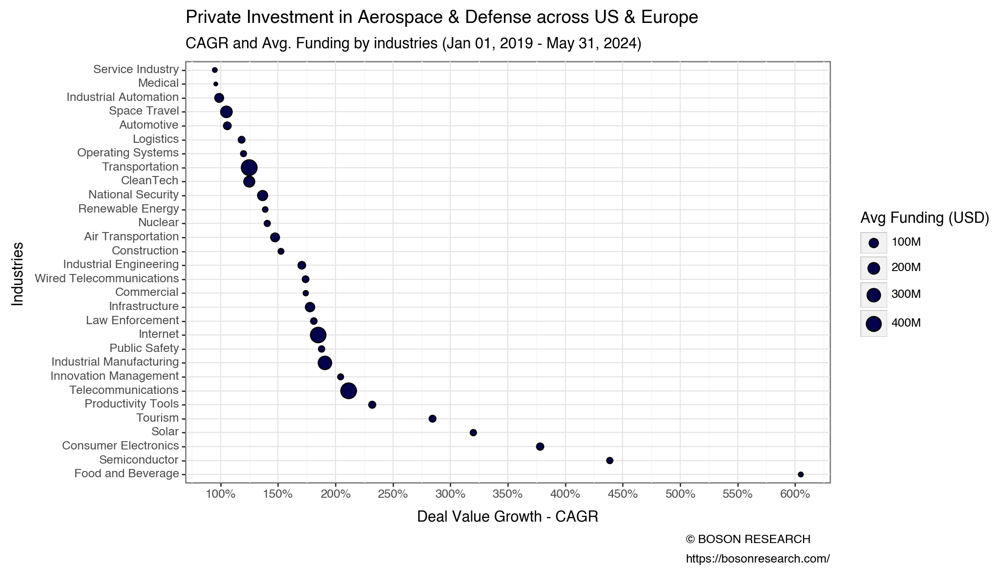

<Figure Size: (1024 x 600)>

In [155]:
df_world_first_last_deal_values_exploded = df_world_first_last_deal_values.explode('industries')
df_world_first_last_deal_values_exploded['industries'] = df_world_first_last_deal_values_exploded['industries'].str.strip()

df_world_cagr_exploded_agg_by_industries = (
    df_world_first_last_deal_values_exploded
    .groupby(['industries'])
    .agg(avg_funding_usd = ('total_funding_usd', 'mean'),
        deal_growth_cagr = ('deal_growth_cagr', 'mean'))
)
df_world_cagr_exploded_agg_by_industries = (
    df_world_cagr_exploded_agg_by_industries
    .reset_index()
)
#df_world_cagr_exploded_agg_by_industries['deal_growth_cagr'] = df_world_cagr_exploded_agg_by_industries['deal_growth_cagr']*100
# df_world_cagr_exploded_agg_by_industries.head(20)

df_world_cagr_exploded_agg_by_industries = df_world_cagr_exploded_agg_by_industries.sort_values(by = "deal_growth_cagr",
                                                                                                ascending=False)
industries = df_world_cagr_exploded_agg_by_industries["industries"].unique()
df_world_cagr_exploded_agg_by_industries = df_world_cagr_exploded_agg_by_industries.assign(
    industry_cat=pd.Categorical(df_world_cagr_exploded_agg_by_industries["industries"], 
                               categories=industries)
)

options.figure_size = (1024 / options.dpi, 600 / options.dpi)
(
    ggplot(df_world_cagr_exploded_agg_by_industries.head(30))
    + geom_point(aes(x="industry_cat", 
                     y="deal_growth_cagr",
                     size="avg_funding_usd"),
               stat="identity",
              fill=boson_blue) 
    + scale_y_continuous(breaks = list(range(0,800,50)),
                         labels = lambda l: ["{}%".format(v) for v in l])
    + scale_size_continuous(labels = lambda l: [add_units(v) for v in l])
    + labs(
        x="Industries",
        y="Deal Value Growth - CAGR",
        title="Private Investment in Aerospace & Defense across US & Europe",
        size="Avg Funding (USD)",
        subtitle ="CAGR and Avg. Funding by industries ({} - {})".format(start_date.strftime('%b %d, %Y'), end_date.strftime('%b %d, %Y')),
        caption=caption,
    )
    + coord_flip()
    + theme(
        # left justify the caption and have one line of space between it and
        # the x-axis label
        plot_caption=element_text(ha="left", margin={"t": 1, "units": "lines"})
    )
    + theme_bw()
)

### Sub-industry: Transportation / Air Transportation

In [87]:
df_world_first_last_deal_values_exploded.head(2)

,name,first_deal_value,first_deal_date,last_deal_value,last_deal_date,last_deal_year,deal_span_years,total_funding_usd,city,country,region,sector,lead_investors,industries,deals,funding_recency,deal_growth_cagr
0,Skyryse,2500000.0,2020-05-15,200000000.0,2021-10-27,2021,1.45,240500000.0,El Segundo,United States,North America,aerospace,—,"Aerospace, Air Transportation, Internet, Trans...",2,older,1066.4
1,AeroVanti,9750000.0,2022-07-21,100000000.0,2022-10-19,2022,0.25,109750000.0,Annapolis,United States,North America,aerospace,Network 1 Financial Securities,"Aerospace, Air Transportation, Transportation",2,recent,1066.4


In [88]:
def make_pretty(styler):
    #styler.set_caption(caption)
    #styler.format(recency)
    styler.background_gradient(axis=None, cmap="Blues")
    return styler

df_world_aerospace_transportaion = (
    df_world_first_last_deal_values_exploded[
    (
        (df_world_first_last_deal_values_exploded['industries'] == 'Transportation') |
        (df_world_first_last_deal_values_exploded['industries'] == 'Air Transportation')
    ) & 
    (
        df_world_first_last_deal_values_exploded['deal_growth_cagr']>0
    )]
    .sort_values(by=['last_deal_year', 'total_funding_usd', 'deals'], ascending=False)
)
df_world_aerospace_transportaion['total_funding_usd_format'] = df_world_aerospace_transportaion['total_funding_usd'].apply(add_units)

# >10M funding
df_world_aerospace_transportaion = df_world_aerospace_transportaion[df_world_aerospace_transportaion['total_funding_usd'] > 10000000] 
df_world_aerospace_transportaion = df_world_aerospace_transportaion[['name', 'last_deal_year', 'total_funding_usd_format', 'country', 'region', 'deals', 'deal_growth_cagr']].rename(columns={
    'name': 'Name',
    'last_deal_year': 'Last Deal Year',
    'total_funding_usd_format': 'Total Funding (USD)',
    'country': 'Country',
    'region': 'Region',
    'deals': 'Number of Funding Deals',
    'deal_growth_cagr': 'Deal CAGR'
})

df_world_aerospace_transportaion.drop_duplicates().head(20).style.pipe(make_pretty)

,Name,Last Deal Year,Total Funding (USD),Country,Region,Number of Funding Deals,Deal CAGR


### Pick: Elroy Air

In [89]:
','.join(df_world_raw[df_world_raw['name']=='Elroy Air']['lead_investors'].str.replace('-', ''))

'—,Lockheed Martin Ventures, Marlinspike Capital, Prosperity7 Ventures,—,Catapult Ventures'

In [90]:
df_world_aerospace_transportaion[df_world_aerospace_transportaion['Region']=='Europe'].drop_duplicates().head(20).style.pipe(make_pretty)

,Name,Last Deal Year,Total Funding (USD),Country,Region,Number of Funding Deals,Deal CAGR


### Pick: Wingcopter

In [91]:
','.join(df_world_raw[df_world_raw['name']=='Wingcopter']['lead_investors'].str.replace('-', ''))

'—,Futury Capital, Xplorer Capital'

# Recent funding rounds with >0 CAGR

In [95]:
df_world_first_last_deal_values.head(2)

,name,first_deal_value,first_deal_date,last_deal_value,last_deal_date,last_deal_year,deal_span_years,total_funding_usd,city,country,region,sector,lead_investors,industries,deals,funding_recency,deal_growth_cagr
0,Skyryse,2500000.0,2020-05-15,200000000.0,2021-10-27,2021,1.45,240500000.0,El Segundo,United States,North America,aerospace,—,"Aerospace, Air Transportation, Internet, Transportation",2,older,1066.4
1,AeroVanti,9750000.0,2022-07-21,100000000.0,2022-10-19,2022,0.25,109750000.0,Annapolis,United States,North America,aerospace,Network 1 Financial Securities,"Aerospace, Air Transportation, Transportation",2,recent,1066.4


In [154]:
pd.set_option('max_colwidth', 700)
df_recent_current_region = df_world_first_last_deal_values[
    (
        (df_world_first_last_deal_values['last_deal_year']==2024) | 
        (df_world_first_last_deal_values['last_deal_year']==2023)
    ) & 
    (df_world_first_last_deal_values['region']==current_region['region']) & 

    (df_world_first_last_deal_values['deal_growth_cagr'] > 0) & 

    (df_world_first_last_deal_values['total_funding_usd'] > 15000000) & 

    (df_world_first_last_deal_values['total_funding_usd'] < 100000000)
].sort_values(by=['total_funding_usd', 'deals', 'deal_growth_cagr'], ascending=False)

df_recent_current_region['total_funding_usd_format'] = df_recent_current_region['total_funding_usd'].apply(add_units)
df_recent_current_region['deal_growth_cagr'] = df_recent_current_region['deal_growth_cagr'].round()
df_recent_current_region['industries_concat'] = df_recent_current_region['industries'].apply(lambda x: ",".join(x))
df_recent_current_region = df_recent_current_region[['name', 'total_funding_usd_format', 'last_deal_year', 'city', 'deals', 'deal_growth_cagr', 'lead_investors', 'industries_concat']].rename(columns={
    'name': 'Name',
    'total_funding_usd_format': 'Total Funding (USD)',
    'last_deal_year': 'Last Deal',
    'city': 'City',
    'deals': '# of Deals',
    'deal_growth_cagr': 'Deal Growth (CAGR)',
    'lead_investors': 'Investors',
    'industries_concat': 'Industries'
}).head(30)

df_recent_current_region.style.pipe(make_pretty)

,Name,Total Funding (USD),Last Deal,City,# of Deals,Deal Growth (CAGR),Investors,Industries
29,Vannevar Labs,87M,2023,Palo Alto,2,270.000000,"Costanoa Ventures, Point72 Ventures,Felicis","Aerospace, Artificial Intelligence (AI), GovTech, National Security, Software"
132,Impulse Space,75M,2023,El Segundo,2,36.000000,"Founders Fund, Lux Capital,Alumni Ventures, RTX Ventures","Aerospace, Manufacturing, Space Travel"
44,Pixxel,71M,2023,El Segundo,5,177.000000,"growX ventures, Techstars,Blume VenBlume Venture Advisors Private Limitedtures, growX ventures, Lightspeed India Partners,Radical Ventures,Google","Aerospace, Geospatial, Information Technology, Satellite Communication"
17,Saronic,70M,2023,Austin,2,595.000000,"8VC,Caffeinated Capital","Artificial Intelligence (AI), Drones, Government, Military, National Security"
88,Portside,67M,2023,San Francisco,2,89.000000,"Tiger Global Management,Insight Partners","Aerospace, Air Transportation, Analytics, Software, Transportation"
133,Benchmark Space Systems,56M,2024,South Burlington,5,36.000000,,"Aerospace, Hardware, Manufacturing"
153,Ramon.Space,44M,2023,Los Altos,2,21.000000,"StageOne Ventures,Ingrasys, Strategic Development Fund","Aerospace, Computer, Electronics, Machine Learning, Semiconductor, Software"
93,Orbit Fab,42M,2023,Lafayette,3,84.000000,"Asymmetry Ventures,8090 Industries","Aerospace, Energy, Infrastructure, Manufacturing, Space Travel"
53,Whisper Aero,40M,2023,Crossville,2,143.000000,"Capricorn Investment Group, Connor Capital SB, EVE Atlas, Menlo Ventures","Aerospace, Air Transportation, GreenTech"
81,Venus Aerospace,39M,2023,Houston,3,98.000000,"Prime Movers Lab,Airbus Ventures, Alumni Ventures","Aerospace, Product Research, Transportation"


In [152]:
print(','.join([ "{} (${})".format(x,y)  for i, (x, y) in enumerate(zip(df_recent_current_region['Name'].values, df_recent_current_region['Total Funding (USD)'].values))]))

Vannevar Labs ($87M),Impulse Space ($75M),Pixxel ($71M),Saronic ($70M),Portside ($67M),Benchmark Space Systems ($56M),Ramon.Space ($44M),Orbit Fab ($42M),Whisper Aero ($40M),Venus Aerospace ($39M),Onebrief ($37M),Biofire ($37M),Vaya Space ($36M),Hydrosat ($36M),Starfish Space ($34M)


In [153]:
df_world_raw[df_world_raw['name'] == 'Hydrosat']

,index,name,money_raised,announced_date,industries,description,funding_type,lead_investors,total_funding,city,...,total_funding_currency,total_funding_amount,money_raised_usd,total_funding_usd,aerospace,defense,announced_date_trunc_month,announced_date_trunc_year,sector,funding_recency
229,281,Hydrosat,$15000000,2023-04-25,"[Aerospace, AgTech, Analytics, Artificial Intelligence (AI), Big Data, Geospatial, Information Services, Machine Learning]","Hydrosat provides geospatial intelligence for food security, critical infrastructure, and the environment.",Series A,Statkraft Ventures,$35623002,Washington,...,$,35623002,15000000.0,35623002.0,True,False,2023-04-01,2023-01-01,aerospace,recent
372,468,Hydrosat,$5000000,2021-11-16,"[Aerospace, AgTech, Analytics, Artificial Intelligence (AI), Big Data, Geospatial, Information Services, Machine Learning]","Hydrosat provides geospatial intelligence for food security, critical infrastructure, and the environment.",Seed,OTB Ventures,$35623002,Washington,...,$,35623002,5000000.0,35623002.0,True,False,2021-11-01,2021-01-01,aerospace,older
373,469,Hydrosat,$5000000,2021-06-17,"[Aerospace, AgTech, Analytics, Artificial Intelligence (AI), Big Data, Geospatial, Information Services, Machine Learning]","Hydrosat provides geospatial intelligence for food security, critical infrastructure, and the environment.",Seed,Cultivation Capital,$35623002,Washington,...,$,35623002,5000000.0,35623002.0,True,False,2021-06-01,2021-01-01,aerospace,older
723,911,Hydrosat,$470000,2019-07-15,"[Aerospace, AgTech, Analytics, Artificial Intelligence (AI), Big Data, Geospatial, Information Services, Machine Learning]","Hydrosat provides geospatial intelligence for food security, critical infrastructure, and the environment.",Pre-Seed,Techstars,$35623002,Washington,...,$,35623002,470000.0,35623002.0,True,False,2019-07-01,2019-01-01,aerospace,older
